<a href="https://colab.research.google.com/github/jenny-cobanaj/Field-Study-Project-Customer_Segmentation/blob/main/2_RFM_Methodology_CustomerSegmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Field Study Project Project (Part 2 : RFM methodology clustering)
Athens University of Economics and Business

Msc in Business Analytics

Written by : Xheni Cobanaj (f2822117)

Supervisor : Mr Damianos Chatziantoniou


# "X" Food delivery app - Customer Segmentation

[![LinkedIn](https://img.shields.io/badge/LinkedIn-Tzeni--Tsobanai-green.svg)](https://www.linkedin.com/in/tzeni-tsobanai)
[![GitHub](https://img.shields.io/badge/GitHub-Jenny--Cobanaj-purple.svg)](https://github.com/jenny-cobanaj)

---

"X" Food delivery app is a well-established online food delivery service that currently operates in numerous regions throughout Greece. The company was first introduced to the public in 2011 as a very promising startup operating in Athens and Thessaloniki. This platform allows customers to place orders with local restaurants via the «X» website or mobile app and have their food, drinks, or coffee delivered directly to their doorstep. Typically, orders are delivered for free or with a minor delivery fee.

---
<center><img width="60%" src="https://localinsider.storage.googleapis.com/2022/07/best-food-delivery-apps-.jpeg"></center>

# The Field Study Project

The goal of this field study project is to provide insights into the customer segmentation of the «X» food delivery app's users, to identify and better understand the different types of customers and their needs, behaviors, and preferences when it comes to food delivery services and to assist the company in making data-driven decisions to improve customer satisfaction and retention, increase revenue, and gain a competitive edge in the market.



First, let's explore the data at hand a little bit better to understand what the characteristics of an order are

# RFM Methodology

RFM segmentation is a marketing technique that categorizes customers based on their purchasing behavior. It stands for recency, frequency, and monetary value, which are three key metrics used to assess a customer's purchasing habits. Recency refers to how recently a customer has made a purchase, with more recent (lower values) purchases being given a higher score. Frequency refers to how often a customer makes purchases, with more frequent purchases receiving a higher score. Finally, monetary value refers to the amount of money a customer spends on each purchase, with higher spending receiving a higher score. The snapshot date for the analysis in the day after the last transaction in the data, which is 1st of June 2021. By analyzing these three metrics for each customer, businesses can divide their customer base into segments based on their purchasing behavior. These segments can then be targeted with tailored marketing campaigns to encourage more purchases and increase customer loyalty.

After creating these variables and scaling our features, we move on to the clustering algorithms.

The Clustering techniques that were implemented are:
* K-Means Clustering
* Agglomerative Hierarchical Clustering
* Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
* Expectation–Maximization (EM) Clustering using Gaussian Mixture Models (GMM)
* Balanced Iterative Reducing and Clustering using Hierarchies (BIRCH)

# Import libraries

In [1]:
# importing all necessary modules

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from IPython.display import Image
from IPython.core.display import HTML 
import seaborn as sns
%matplotlib inline
import scipy.stats as stats
from datetime import datetime
from itertools import product
import re
import itertools
import string
import collections
from collections import Counter
# For getting optimal number of clusters in hierarchical clustering
from scipy.cluster.hierarchy import dendrogram,linkage
# To scale the data
from sklearn.preprocessing import MinMaxScaler,StandardScaler
# metrics to evaluate the clusters
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Clustering alorithms
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

import plotly as py
import plotly.graph_objs as go
# activating DND to disregard the warnings by goiing silent mode
import warnings
warnings.filterwarnings('ignore')

In [13]:
plt.style.use('fivethirtyeight')

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Read Data

In [3]:
df = pd.read_csv("/content/drive/MyDrive/cust_segm_pre.csv",header=0,parse_dates= ['order_timestamp','last_order_at','first_order_at'])
print("Columns present in the data: ",[i for i in df.columns])
print("Number of data points: ",df.shape[0])
df.head()

Columns present in the data:  ['customer_id', 'order_id', 'order_timestamp', 'item_name', 'category_name', 'item_price', 'item_quantity', 'shop_id', 'shop_is_chain', 'delivered_by_efood', 'shop_cuisine', 'is_online_payment', 'order_has_discount_coupon', 'order_from_pinata', 'geographical_region_of_user', 'shop_city', 'geographical_region_of_shop', 'last_order_at', 'first_order_at', 'items_per_order', 'nr_of_cuisines', 'day_of_week', 'period', 'part_of_the_day', 'hour', 'day', 'income_class']
Number of data points:  1448011


,customer_id,order_id,order_timestamp,item_name,category_name,item_price,item_quantity,shop_id,shop_is_chain,delivered_by_efood,...,last_order_at,first_order_at,items_per_order,nr_of_cuisines,day_of_week,period,part_of_the_day,hour,day,income_class
0,ffa59d28b6c38f291755acc2777e4fec,294c1055f6764a565f52c98b23b6f877,2021-05-23 00:29:35+00:00,ποικιλία κρεάτων 2 ατόμων,Μερίδες της ώρας,17.00,1,b53467be0eb3414b91f31b7d7ba419ff,False,False,...,2021-05-30,2018-12-01,1,8,Sunday,Late Night,Night,0,23,middle-class
1,b878ec7fc5e19df3e8511c02212314dd,102884ef509e62864e4cf1e84327d38e,2021-05-06 14:24:08+00:00,κοτόπουλο παϊδάκια σχάρας το κιλό,Με το κιλό,4.95,1,84d9ee44e457ddef7f2c4f25dc8fa865,True,False,...,2021-05-24,2016-02-26,2,5,Thursday,Noon,Afternoon,14,6,wealthy
2,b878ec7fc5e19df3e8511c02212314dd,102884ef509e62864e4cf1e84327d38e,2021-05-06 14:24:08+00:00,φιλετίνια κοτόπουλου πανέ ατομική,Φρέσκες σαλάτες ατομικές,3.10,1,84d9ee44e457ddef7f2c4f25dc8fa865,True,False,...,2021-05-24,2016-02-26,2,5,Thursday,Noon,Afternoon,14,6,wealthy
3,08665491d12f6cf4477eddc3afc9ea04,dcea001be354306c6fd6591863cb6327,2021-05-11 19:14:39+00:00,γύρος κοτόπουλο σε πίτα,Τυλιχτά,2.50,1,059ba4b62a266b78c6988528f4ef891c,False,False,...,2021-05-25,2018-10-22,3,5,Tuesday,Evening,Evening,19,11,middle-class
4,08665491d12f6cf4477eddc3afc9ea04,dcea001be354306c6fd6591863cb6327,2021-05-11 19:14:39+00:00,γύρος κοτόπουλο σε πίτα,Τυλιχτά,2.50,1,059ba4b62a266b78c6988528f4ef891c,False,False,...,2021-05-25,2018-10-22,3,5,Tuesday,Evening,Evening,19,11,middle-class


In [4]:
"The 'X' food delivery app dataset contains {} columns and {} rows".format(df.shape[1],df.shape[0])

"The 'X' food delivery app dataset contains 27 columns and 1448011 rows"

In [6]:
# Time period
print('Snapshot of study for the customer segmentation model is:', df.order_timestamp.min(), ' - ', df.order_timestamp.max())

Snapshot of study for the customer segmentation model is: 2021-04-01 00:00:16+00:00  -  2021-05-31 23:59:51+00:00


In [7]:
# Create TotalSum colummn
df["TotalSum"] = df["item_quantity"] * df["item_price"]
df.head()

,customer_id,order_id,order_timestamp,item_name,category_name,item_price,item_quantity,shop_id,shop_is_chain,delivered_by_efood,...,first_order_at,items_per_order,nr_of_cuisines,day_of_week,period,part_of_the_day,hour,day,income_class,TotalSum
0,ffa59d28b6c38f291755acc2777e4fec,294c1055f6764a565f52c98b23b6f877,2021-05-23 00:29:35+00:00,ποικιλία κρεάτων 2 ατόμων,Μερίδες της ώρας,17.00,1,b53467be0eb3414b91f31b7d7ba419ff,False,False,...,2018-12-01,1,8,Sunday,Late Night,Night,0,23,middle-class,17.00
1,b878ec7fc5e19df3e8511c02212314dd,102884ef509e62864e4cf1e84327d38e,2021-05-06 14:24:08+00:00,κοτόπουλο παϊδάκια σχάρας το κιλό,Με το κιλό,4.95,1,84d9ee44e457ddef7f2c4f25dc8fa865,True,False,...,2016-02-26,2,5,Thursday,Noon,Afternoon,14,6,wealthy,4.95
2,b878ec7fc5e19df3e8511c02212314dd,102884ef509e62864e4cf1e84327d38e,2021-05-06 14:24:08+00:00,φιλετίνια κοτόπουλου πανέ ατομική,Φρέσκες σαλάτες ατομικές,3.10,1,84d9ee44e457ddef7f2c4f25dc8fa865,True,False,...,2016-02-26,2,5,Thursday,Noon,Afternoon,14,6,wealthy,3.10
3,08665491d12f6cf4477eddc3afc9ea04,dcea001be354306c6fd6591863cb6327,2021-05-11 19:14:39+00:00,γύρος κοτόπουλο σε πίτα,Τυλιχτά,2.50,1,059ba4b62a266b78c6988528f4ef891c,False,False,...,2018-10-22,3,5,Tuesday,Evening,Evening,19,11,middle-class,2.50
4,08665491d12f6cf4477eddc3afc9ea04,dcea001be354306c6fd6591863cb6327,2021-05-11 19:14:39+00:00,γύρος κοτόπουλο σε πίτα,Τυλιχτά,2.50,1,059ba4b62a266b78c6988528f4ef891c,False,False,...,2018-10-22,3,5,Tuesday,Evening,Evening,19,11,middle-class,2.50


# Encode boolean values to 0 and 1

In [8]:
# Replacing columns with f/t to 0/1 in order to use the clustering models
#df = df.replace({"False": 0, "True": 1})
df["shop_is_chain"] = df["shop_is_chain"].astype(int)
df["order_has_discount_coupon"] = df["order_has_discount_coupon"].astype(int)
df["is_online_payment"] = df["is_online_payment"].astype(int)
df["delivered_by_efood"] = df["delivered_by_efood"].astype(int)
df["order_from_pinata"] = df["order_from_pinata"].astype(int)


# Building RFM Dataset

In [9]:
# Convert to show date only
df['order_timestamp']=pd.to_datetime(df['order_timestamp']).apply(lambda x: x.date())
df['last_order_at']=pd.to_datetime(df['last_order_at']).apply(lambda x: x.date())
df['first_order_at']=pd.to_datetime(df['first_order_at']).apply(lambda x: x.date())
df

,customer_id,order_id,order_timestamp,item_name,category_name,item_price,item_quantity,shop_id,shop_is_chain,delivered_by_efood,...,first_order_at,items_per_order,nr_of_cuisines,day_of_week,period,part_of_the_day,hour,day,income_class,TotalSum
0,ffa59d28b6c38f291755acc2777e4fec,294c1055f6764a565f52c98b23b6f877,2021-05-23,ποικιλία κρεάτων 2 ατόμων,Μερίδες της ώρας,17.00,1,b53467be0eb3414b91f31b7d7ba419ff,0,0,...,2018-12-01,1,8,Sunday,Late Night,Night,0,23,middle-class,17.00
1,b878ec7fc5e19df3e8511c02212314dd,102884ef509e62864e4cf1e84327d38e,2021-05-06,κοτόπουλο παϊδάκια σχάρας το κιλό,Με το κιλό,4.95,1,84d9ee44e457ddef7f2c4f25dc8fa865,1,0,...,2016-02-26,2,5,Thursday,Noon,Afternoon,14,6,wealthy,4.95
2,b878ec7fc5e19df3e8511c02212314dd,102884ef509e62864e4cf1e84327d38e,2021-05-06,φιλετίνια κοτόπουλου πανέ ατομική,Φρέσκες σαλάτες ατομικές,3.10,1,84d9ee44e457ddef7f2c4f25dc8fa865,1,0,...,2016-02-26,2,5,Thursday,Noon,Afternoon,14,6,wealthy,3.10
3,08665491d12f6cf4477eddc3afc9ea04,dcea001be354306c6fd6591863cb6327,2021-05-11,γύρος κοτόπουλο σε πίτα,Τυλιχτά,2.50,1,059ba4b62a266b78c6988528f4ef891c,0,0,...,2018-10-22,3,5,Tuesday,Evening,Evening,19,11,middle-class,2.50
4,08665491d12f6cf4477eddc3afc9ea04,dcea001be354306c6fd6591863cb6327,2021-05-11,γύρος κοτόπουλο σε πίτα,Τυλιχτά,2.50,1,059ba4b62a266b78c6988528f4ef891c,0,0,...,2018-10-22,3,5,Tuesday,Evening,Evening,19,11,middle-class,2.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1448006,4e6ab3dfff3219ffbfa26b8a2231f1a5,90260a55a7310e58a9ec1e68fd93c87e,2021-05-31,μπιφτέκι μοσχαρίσιο,Τεμάχια,1.80,2,cdbca39d5affb98cb346d0a09cbf75d2,1,0,...,2016-01-09,3,6,Monday,Noon,Afternoon,14,31,middle-class,3.60
1448007,4e6ab3dfff3219ffbfa26b8a2231f1a5,90260a55a7310e58a9ec1e68fd93c87e,2021-05-31,αγγουροντομάτα,Σαλάτες,2.20,1,cdbca39d5affb98cb346d0a09cbf75d2,1,0,...,2016-01-09,3,6,Monday,Noon,Afternoon,14,31,middle-class,2.20
1448008,a7fc2aa3cbf6af426416d5919698f47f,f19b2a3c77ec1a361cccf1d224b2dbf6,2021-05-21,πατάτες τηγανητές ολόκληρη μερίδα,Νηστίσιμο menu,3.20,1,60839a4e1fee471eb7c0bc2bb88d1127,1,0,...,2018-06-02,3,4,Friday,Noon,Afternoon,15,21,middle-class,3.20
1448009,a7fc2aa3cbf6af426416d5919698f47f,f19b2a3c77ec1a361cccf1d224b2dbf6,2021-05-21,παραδοσιακό φαλάφελ,Νηστίσιμο menu,3.80,1,60839a4e1fee471eb7c0bc2bb88d1127,1,0,...,2018-06-02,3,4,Friday,Noon,Afternoon,15,21,middle-class,3.80


In [10]:
# Create date variable that records recency
import datetime
snapshot_date = max(df.order_timestamp) + datetime.timedelta(days=1)
snapshot_date

datetime.date(2021, 6, 1)

In [11]:
# Aggregate data by each customer
rfm_data = df.groupby(['customer_id']).agg({
    'last_order_at': lambda x: (snapshot_date - x.max()).days,
    'order_timestamp': 'nunique',
    'TotalSum': 'sum'})
# Rename columns
rfm_data.rename(columns = {'last_order_at': 'Recency',
                            'order_timestamp': 'Frequency',
                            'TotalSum': 'MonetaryValue'}, inplace=True)


In [12]:
rfm_data.head(3)

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,2,32,423.40
0003b7de618c1acfc67eac91b853b287,4,31,343.35
00045e9d1c96d7e2353f886704e51c88,13,13,43.80


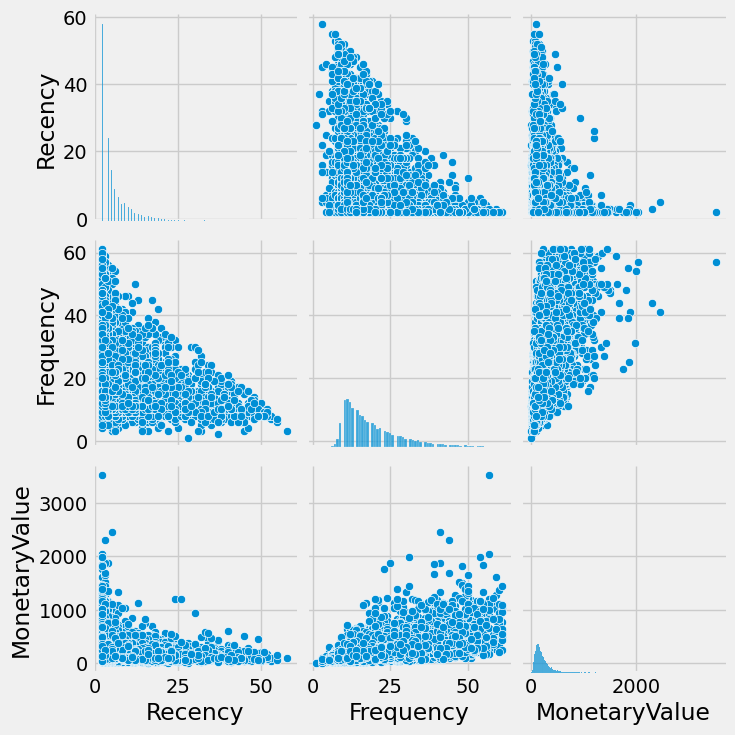

In [14]:
sns.pairplot(rfm_data)

<Axes: xlabel='Frequency', ylabel='Recency'>

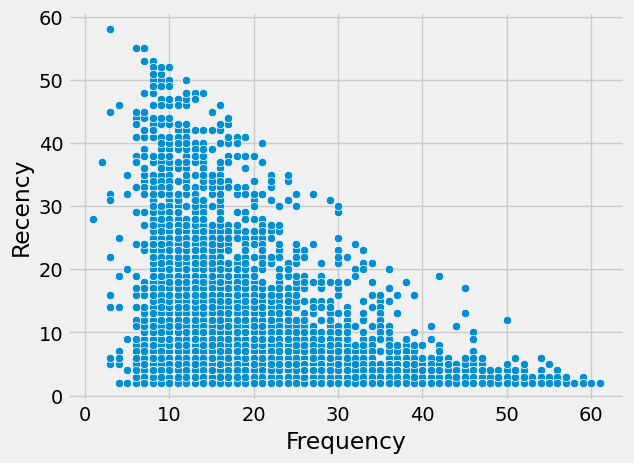

In [15]:
sns.scatterplot(x=rfm_data['Frequency'],
                y=rfm_data['Recency'])

<Axes: xlabel='Frequency', ylabel='MonetaryValue'>

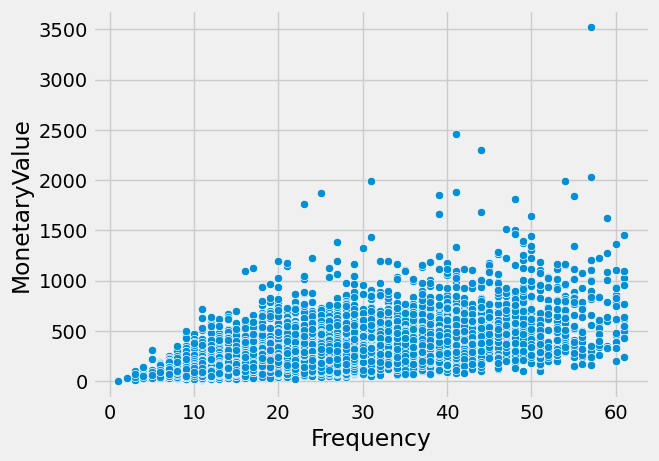

In [16]:
sns.scatterplot(x=rfm_data['Frequency'],
                y=rfm_data['MonetaryValue'])

# Quantile based Clustering

Prior to employing machine learning algorithms, a simple heuristic method was utilized to obtain some preliminary information about the potential segments that could be created later. This involved categorizing all three features into four groups based on their 25%, 50%, and 75% percentiles. In order to prioritize higher frequency and monetary values, a score of 4 was given to the 75th percentile, 3 to the 50th percentile, and so on. Conversely, since smaller recency values indicate more recent customer orders from the app, a score of 4 was given to the 25th percentile, and the column was filled in decreasing order.

Below is the conversion of columns into rfm scores between 1 to 4.

'4' being the highest and '1' being the lowest.

The higher the monetary value, the higher the score is, in our case max being'4' .
Smaller the value of recency indicates recent purchases, so it takes the higher value of 4.
Frequency is the same as monetary, the higher the frequency, the higher the score.

In [17]:
rfm_data_q=rfm_data.copy()

In [18]:
#Get basic summary statistics from the data
pd.DataFrame(rfm_data_q.describe().round(3))

,Recency,Frequency,MonetaryValue
count,24998.000,24998.000,24998.000
mean,5.740,19.141,221.371
std,6.052,9.494,155.328
min,2.000,1.000,4.200
25%,2.000,12.000,123.900
50%,4.000,16.000,180.900
75%,6.000,24.000,271.550
max,58.000,61.000,3517.700


In [19]:
quantiles = rfm_data_q.quantile(q=[0.25,0.50,0.75])
quantiles = quantiles.to_dict()

In [20]:
def recency_scoring(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [21]:
 def fm_scoring(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4

In [22]:
rfm_data_q['R_quartile'] = rfm_data_q['Recency'].apply(recency_scoring, args=('Recency',quantiles))
rfm_data_q['F_quartile'] = rfm_data_q['Frequency'].apply(fm_scoring, args=('Frequency',quantiles))
rfm_data_q['M_quartile'] = rfm_data_q['MonetaryValue'].apply(fm_scoring, args=('MonetaryValue',quantiles))
rfm_data_q.head()


,Recency,Frequency,MonetaryValue,R_quartile,F_quartile,M_quartile
customer_id,,,,,,
0001496e540173a40362759ed10b3ce2,2,32,423.40,4,4,4
0003b7de618c1acfc67eac91b853b287,4,31,343.35,3,4,4
00045e9d1c96d7e2353f886704e51c88,13,13,43.80,1,2,1
000e223791e890e85938d71bee32cf5a,3,46,122.50,3,4,1
0016652ea3c3a1176dd2385e89de9ff6,2,35,456.70,4,4,4


In [23]:
rfm_data_q['RFM_Segment'] = rfm_data_q.R_quartile.map(str)+rfm_data_q.F_quartile.map(str)+rfm_data_q.M_quartile.map(str)
rfm_data_q.head()

,Recency,Frequency,MonetaryValue,R_quartile,F_quartile,M_quartile,RFM_Segment
customer_id,,,,,,,
0001496e540173a40362759ed10b3ce2,2,32,423.40,4,4,4,444
0003b7de618c1acfc67eac91b853b287,4,31,343.35,3,4,4,344
00045e9d1c96d7e2353f886704e51c88,13,13,43.80,1,2,1,121
000e223791e890e85938d71bee32cf5a,3,46,122.50,3,4,1,341
0016652ea3c3a1176dd2385e89de9ff6,2,35,456.70,4,4,4,444


In [24]:
rfm_data_q['RFM_Score'] = rfm_data_q[['R_quartile','F_quartile','M_quartile']].sum(axis=1)
rfm_data_q.head()

,Recency,Frequency,MonetaryValue,R_quartile,F_quartile,M_quartile,RFM_Segment,RFM_Score
customer_id,,,,,,,,
0001496e540173a40362759ed10b3ce2,2,32,423.40,4,4,4,444,12
0003b7de618c1acfc67eac91b853b287,4,31,343.35,3,4,4,344,11
00045e9d1c96d7e2353f886704e51c88,13,13,43.80,1,2,1,121,4
000e223791e890e85938d71bee32cf5a,3,46,122.50,3,4,1,341,8
0016652ea3c3a1176dd2385e89de9ff6,2,35,456.70,4,4,4,444,12


In [25]:
# assign labels from total score
score_labels = ['Lost', 'About_to_dump_you', 'Loyal_Customers','Best_Customers']
score_groups = pd.qcut(rfm_data_q.RFM_Score, q = 4, labels = score_labels)
rfm_data_q['RFM_Level'] = score_groups.values
rfm_data_q.head()

,Recency,Frequency,MonetaryValue,R_quartile,F_quartile,M_quartile,RFM_Segment,RFM_Score,RFM_Level
customer_id,,,,,,,,,
0001496e540173a40362759ed10b3ce2,2,32,423.40,4,4,4,444,12,Best_Customers
0003b7de618c1acfc67eac91b853b287,4,31,343.35,3,4,4,344,11,Best_Customers
00045e9d1c96d7e2353f886704e51c88,13,13,43.80,1,2,1,121,4,Lost
000e223791e890e85938d71bee32cf5a,3,46,122.50,3,4,1,341,8,About_to_dump_you
0016652ea3c3a1176dd2385e89de9ff6,2,35,456.70,4,4,4,444,12,Best_Customers


In [26]:
print("Best Customers: ",len(rfm_data_q[rfm_data_q['RFM_Segment']=='444']))
print('Loyal Customers: ',len(rfm_data_q[rfm_data_q['F_quartile']==4]))
print("Big Spenders: ",len(rfm_data_q[rfm_data_q['M_quartile']==4]))
print('Lost Customers: ',len(rfm_data_q[rfm_data_q['RFM_Segment']=='211']))
print('Lost Cheap Customers: ',len(rfm_data_q[rfm_data_q['RFM_Segment']=='111']))

Best Customers:  1985
Loyal Customers:  5711
Big Spenders:  6249
Lost Customers:  547
Lost Cheap Customers:  1614


# Normalising Data

As we can see from the below distribution plots for the variables Recency, Frequency and Monetary in which we would like to use in order to cluster our customers,the variables are not normally distributed and have
high values of skewness to the right. Therefore, in order to normalize the data we will transform the variables using log-transformation and standard scalar functions.

In [27]:
rfm_data.describe()

,Recency,Frequency,MonetaryValue
count,24998.000000,24998.000000,24998.000000
mean,5.739859,19.140571,221.371019
std,6.052402,9.494231,155.327796
min,2.000000,1.000000,4.200000
25%,2.000000,12.000000,123.900000
50%,4.000000,16.000000,180.900000
75%,6.000000,24.000000,271.550000
max,58.000000,61.000000,3517.700000


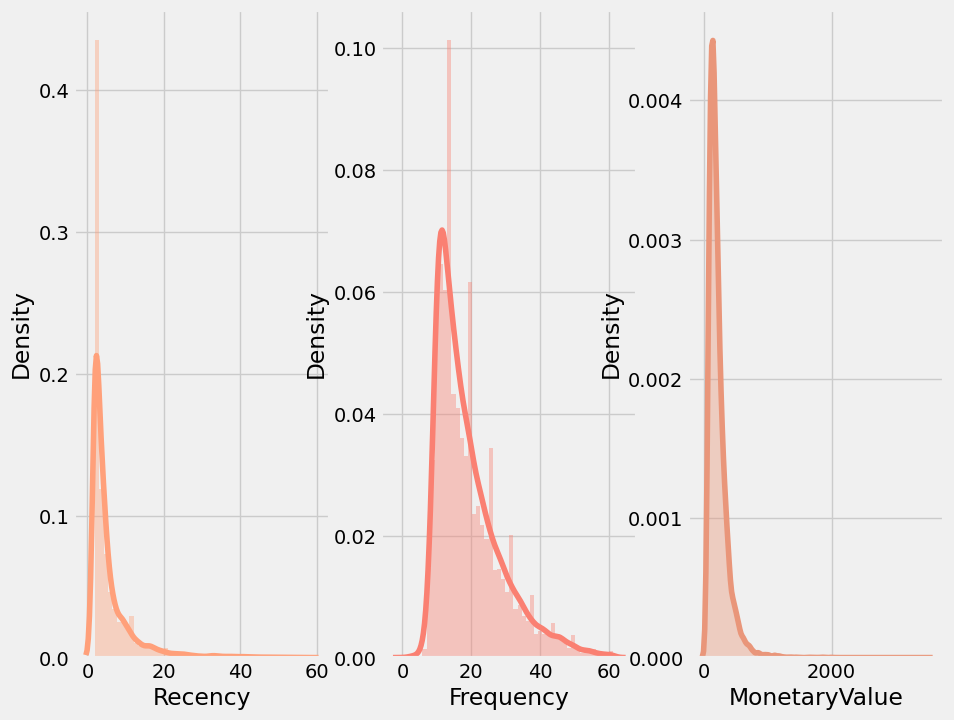

In [28]:
fig, ax = plt.subplots(1, 3, figsize=(10,8))
sns.distplot(rfm_data['Recency'], ax=ax[0],color = 'lightsalmon')
sns.distplot(rfm_data['Frequency'], ax=ax[1],color = 'salmon')
sns.distplot(rfm_data['MonetaryValue'], ax=ax[2],color = 'darksalmon')
# plt.tight_layout()
plt.show()

<Axes: >

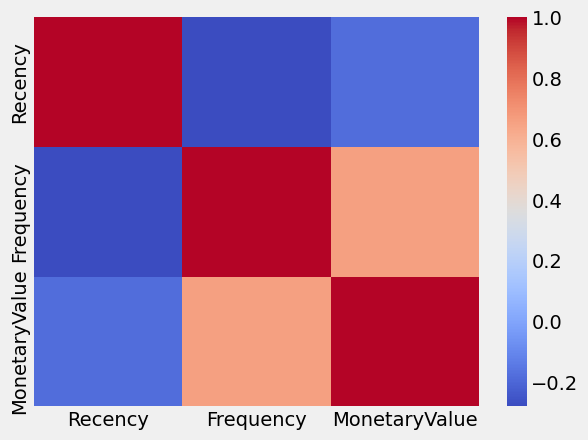

In [29]:
sns.heatmap(rfm_data.corr(),cmap="coolwarm")

In [30]:
# Apply Log Transformation
#rfm_data['MonetaryValue'] = rfm_data['MonetaryValue'] + 0.0000000001
r_log = np.log(rfm_data['Recency'])
f_log = np.log(rfm_data['Frequency'])
m_log = np.log(rfm_data['MonetaryValue'])

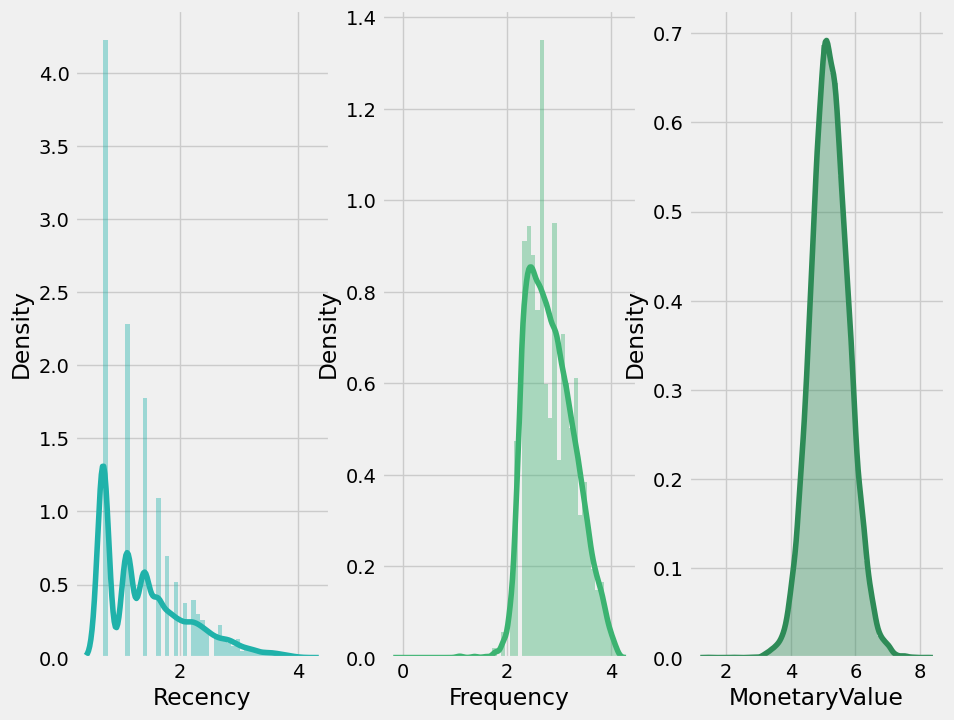

In [31]:
fig, ax = plt.subplots(1, 3, figsize=(10,8))
sns.distplot(r_log, ax=ax[0],color = 'lightseagreen')
sns.distplot(f_log, ax=ax[1],color = 'mediumseagreen')
sns.distplot(m_log, ax=ax[2],color = 'seagreen')
plt.show()

In [32]:
# unskew the data
rfm_data_normalized = rfm_data[['Recency', 'Frequency', 'MonetaryValue']].apply(np.log, axis = 1).round(3)
rfm_data_normalized

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,0.693,3.466,6.048
0003b7de618c1acfc67eac91b853b287,1.386,3.434,5.839
00045e9d1c96d7e2353f886704e51c88,2.565,2.565,3.780
000e223791e890e85938d71bee32cf5a,1.099,3.829,4.808
0016652ea3c3a1176dd2385e89de9ff6,0.693,3.555,6.124
...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,1.099,2.485,5.409
fff262fbc647360700cee69566e26989,1.099,2.565,5.107
fff355794e97eaaf07f53f4fdb4d0cd2,1.099,2.639,5.514


# Scaling data

We need to apply standardization to our features before using any distance-based machine learning model such as K-Means.

In general, We want to treat all the features equally and we can achieve that by transforming the features in such a way that their values fall within the same numerical range such as [0:1].

In [33]:
# Import library
from sklearn.preprocessing import StandardScaler
# Initialize the Object
scaler = StandardScaler()
# Fit and Transform The Data
scaler.fit(rfm_data_normalized)
rfm_normalized_scaled = scaler.transform(rfm_data_normalized)
# Assert that it has mean 0 and variance 1
print(rfm_normalized_scaled.mean(axis = 0).round(2))
print(rfm_normalized_scaled.std(axis = 0).round(2)) 

[-0. -0. -0.]
[1. 1. 1.]


In [34]:
df_std = pd.DataFrame(data = rfm_normalized_scaled,columns = rfm_data_normalized.columns,index=rfm_data_normalized.index)
df_std

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521
...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,-0.453096,-0.802630,0.322625
fff262fbc647360700cee69566e26989,-0.453096,-0.624766,-0.184184
fff355794e97eaaf07f53f4fdb4d0cd2,-0.453096,-0.460241,0.498833


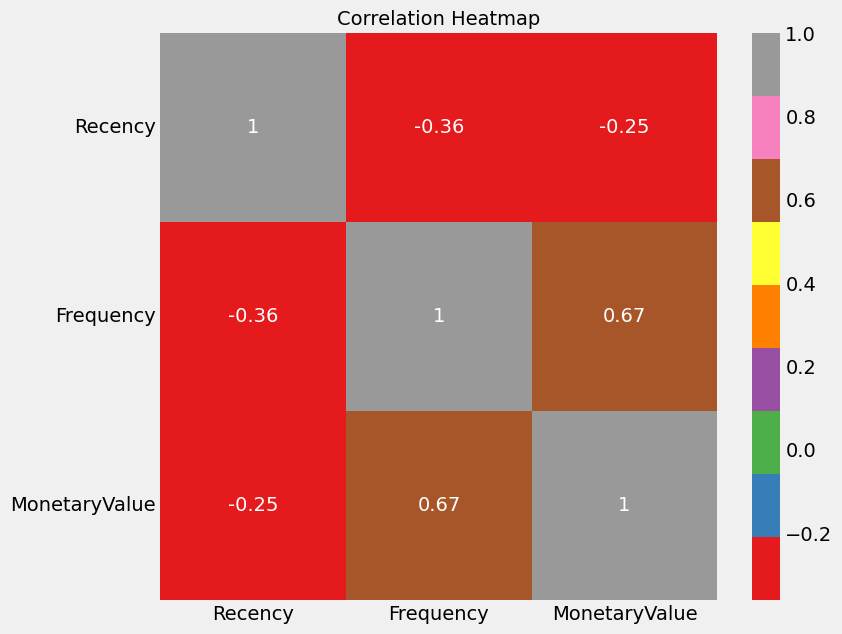

In [35]:
plt.figure(figsize=(8,7))
sns.heatmap(df_std.corr(),annot=True,cmap='Set1')
plt.title('Correlation Heatmap',fontsize=14)
plt.yticks(rotation =0)
plt.show()

# Clustering models

## K-means Clustering

When building a clustering model, we need to decide how many segments we want to group the data into. This is achieved by a heuristic method called the elbow method.

We will create a loop and run the K-Means algorithm from 1 to 10 clusters. Then, we can plot model results for this range of values and select the elbow of the curve as the number of clusters to use.

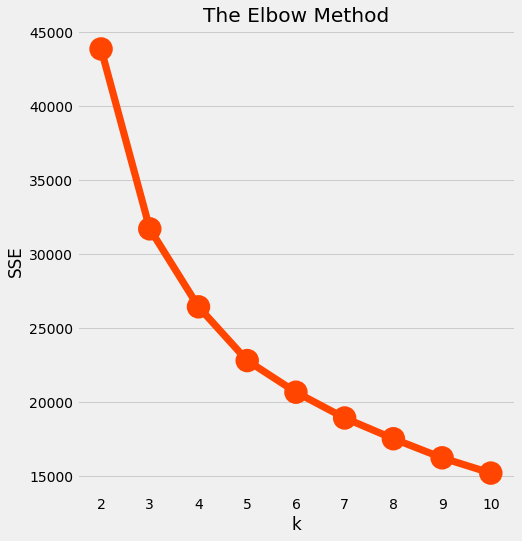

In [ ]:
from sklearn.cluster import KMeans
plt.figure(figsize=(7,8))

plt.style.use('fivethirtyeight')
sse = {}
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_std)
    sse[k] = kmeans.inertia_ # SSE to closest cluster centroid
plt.title('The Elbow Method')
plt.xlabel('k')
plt.ylabel('SSE')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()),color='orangered',capsize=.4,marker = 'o', linestyle = '-.')
plt.show()

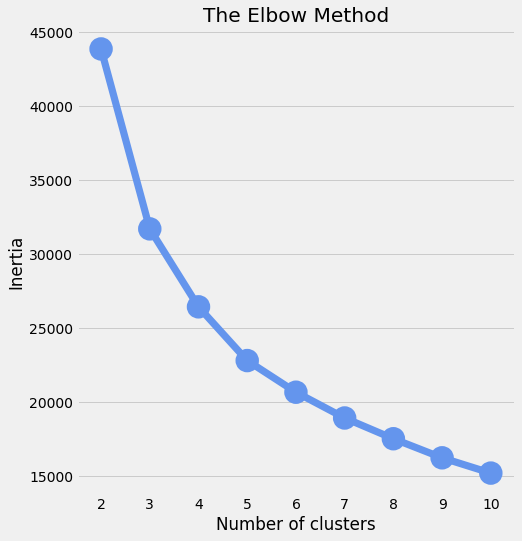

In [ ]:
plt.figure(figsize=(7,8))
plt.style.use('fivethirtyeight')
sse = {}
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42,init='k-means++')
    kmeans.fit(df_std)
    sse[k] = kmeans.inertia_ # SSE to closest cluster centroid
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()),color='cornflowerblue',marker='o',linestyle = '-.')
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 24998 samples in 0.024s...
[t-SNE] Computed neighbors for 24998 samples in 1.748s...
[t-SNE] Computed conditional probabilities for sample 1000 / 24998
[t-SNE] Computed conditional probabilities for sample 2000 / 24998
[t-SNE] Computed conditional probabilities for sample 3000 / 24998
[t-SNE] Computed conditional probabilities for sample 4000 / 24998
[t-SNE] Computed conditional probabilities for sample 5000 / 24998
[t-SNE] Computed conditional probabilities for sample 6000 / 24998
[t-SNE] Computed conditional probabilities for sample 7000 / 24998
[t-SNE] Computed conditional probabilities for sample 8000 / 24998
[t-SNE] Computed conditional probabilities for sample 9000 / 24998
[t-SNE] Computed conditional probabilities for sample 10000 / 24998
[t-SNE] Computed conditional probabilities for sample 11000 / 24998
[t-SNE] Computed conditional probabilities for sample 12000 / 24998
[t-SNE] Computed conditional probabilities for sam

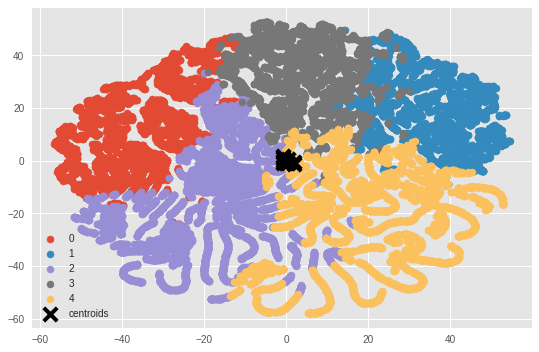

In [ ]:
from sklearn.manifold import TSNE

tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=500)
tsne = tsne_model.fit_transform(df_std)
tsne = pd.DataFrame(tsne)
tsne['k'] = m.labels_

for cluster in np.unique(m.labels_): # plot data by cluster
    plt.scatter(x=tsne.where(tsne['k']==cluster)[0],
                y=tsne.where(tsne['k']==cluster)[1],
                label=cluster)

plt.scatter(kmeans.cluster_centers_[:,0],
            kmeans.cluster_centers_[:,1],
            marker='x',color='black',s=180,
            label='centroids')
plt.legend();

In [ ]:
# calculate the Silhouette Coefficient
sil_score = silhouette_score(df_std, m.labels_)
print(f"Silhouette Coefficient for K-means model with (k=5): {sil_score:.4f}")

# calculate the Calinski-Harabasz Index
ch_score = calinski_harabasz_score(df_std, m.labels_)
print(f"Calinski-Harabasz Index for K-means model with (k=5): {ch_score:.4f}")

# calculate the Davies-Bouldin Index
db_score = davies_bouldin_score(df_std, m.labels_)
print(f"Davies-Bouldin Index for K-means model with (k=5): {db_score:.4f}\n")

Silhouette Coefficient for K-means model with (k=5): 0.2829
Calinski-Harabasz Index for K-means model with (k=5): 14297.7662
Davies-Bouldin Index for K-means model with (k=5): 1.0758



The graph below shows the reduction of a distortion score as the number of clusters increases.

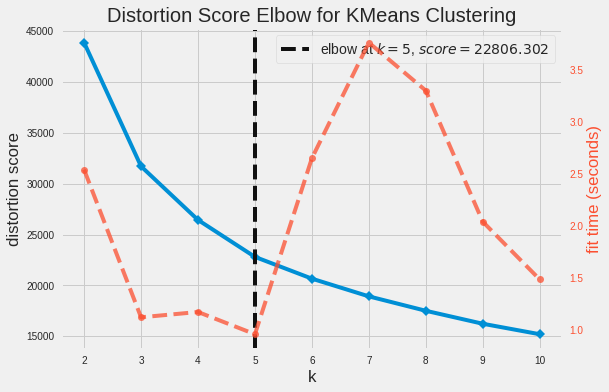

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
plt.style.use('fivethirtyeight')
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,11))
visualizer.fit(df_std)
visualizer.show()
plt.show()

To evaluate the performance of this model, we will use a metric called the silhouette score. This is a coefficient value that ranges from -1 to +1. A higher silhouette score is indicative of a better model.



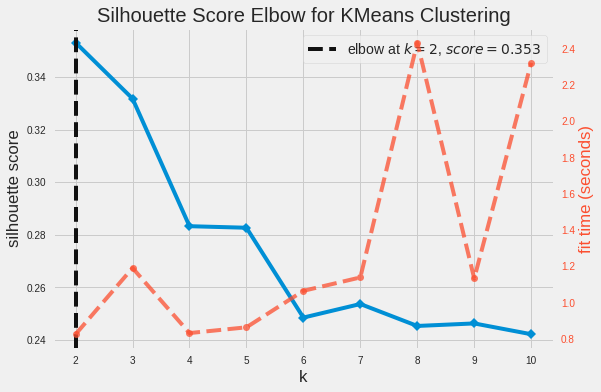

In [ ]:
model = KMeans(random_state=42)
plt.style.use('fivethirtyeight')
visualizer = KElbowVisualizer(model, k=(2,11), metric='silhouette')
visualizer.fit(df_std)
visualizer.show()
plt.show()

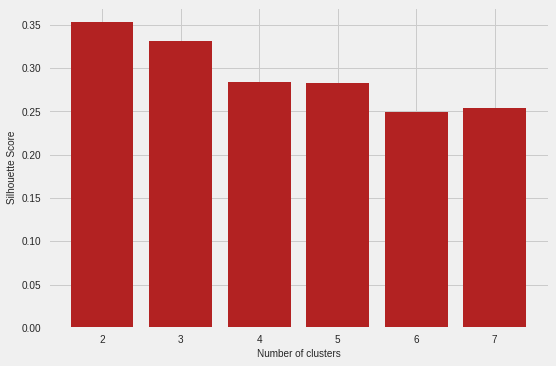

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = [] 

for n_cluster in range(2, 8):
    silhouette_scores.append( 
        silhouette_score(df_std, KMeans(n_clusters = n_cluster).fit_predict(df_std))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7] 
plt.bar(k, silhouette_scores,color='firebrick') 
plt.title('Silhouette score for different number of clusters')
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show()

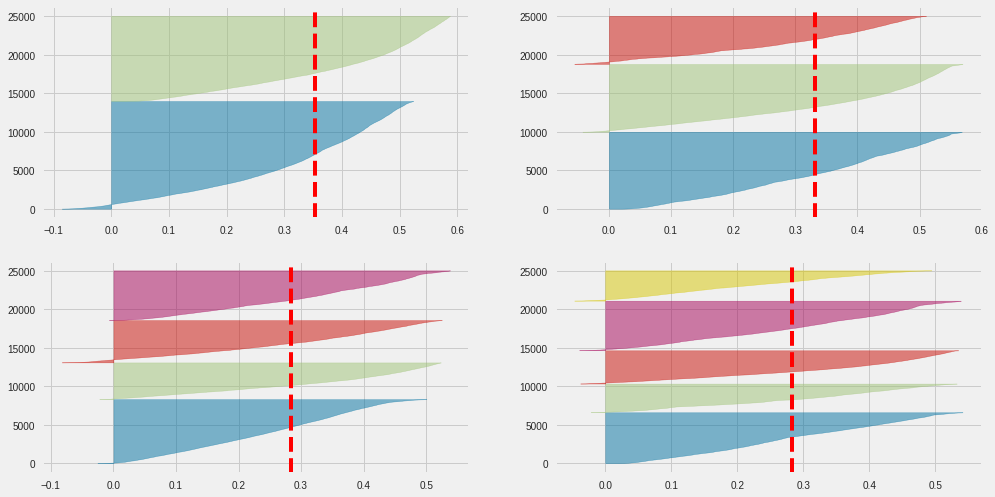

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
 
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_std)

The optimal number of clusters appears to be 5!

### Evaluation of k-means clustering:

([<matplotlib.axis.XTick at 0x7f0d7c23a400>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

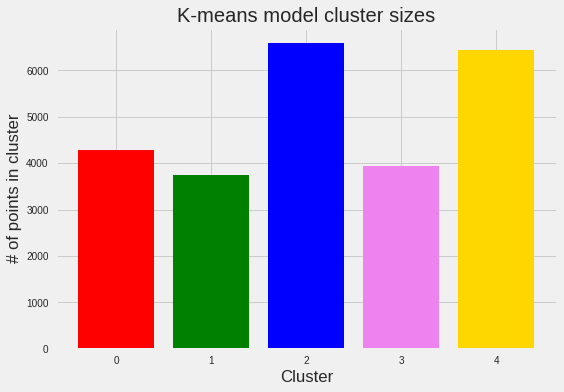

In [ ]:
# best_k = 5
m = KMeans(n_clusters=5)
m.fit(df_std)
labels = m.predict(df_std)
n_0 = len(np.where(labels==0)[0])
n_1 = len(np.where(labels==1)[0])
n_2 = len(np.where(labels==2)[0])
n_3 = len(np.where(labels==3)[0])
n_4 = len(np.where(labels==4)[0])
plt.style.use('fivethirtyeight')
plt.bar(range(5), [n_0, n_1, n_2, n_3,n_4], align='center',color=['red', 'green', 'blue', 'violet','gold'])
plt.title('K-means model cluster sizes')
plt.xlabel('Cluster')
plt.ylabel('# of points in cluster')
plt.xticks(range(5),['0', '1', '2', '3','4'])

The silhouette coefficient of this model is 0.28, indicating reasonable cluster separation.



In [ ]:
from sklearn.metrics import silhouette_score
print(silhouette_score(df_std, m.labels_, metric='euclidean'))

0.28285134947658097


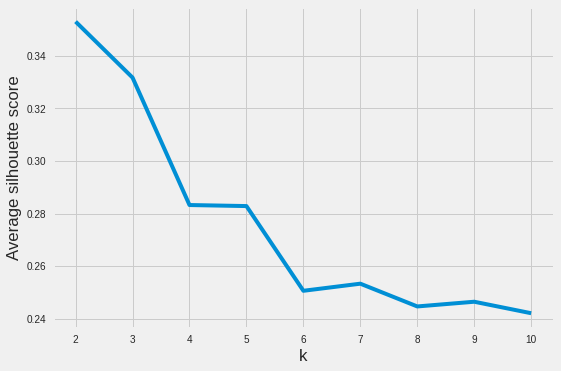

In [ ]:
from sklearn.metrics import silhouette_score
silhouettes = []
for k in range(2,11):
    kmean = KMeans(n_clusters=k)
    kmean.fit(df_std)
    labels = kmean.predict(df_std)
    silhouette = silhouette_score(df_std, labels)
    silhouettes.append(silhouette)
    
    
plt.plot(range(2,11), silhouettes)
plt.xlabel('k')
plt.ylabel('Average silhouette score')
plt.show()

In [ ]:
# We create a new data frame with the original features and add a new column with the assigned clusters for each point.
df_std2= df_std.copy()
df_std2['Cluster'] = m.labels_
# df_normalized = pd.DataFrame(df_std2, columns=['Recency', 'Frequency', 'MonetaryValue'])
df_std2['ID'] = df_std2.index
# df_normalized['Cluster'] = model.labels_
df_std2.head()

,Recency,Frequency,MonetaryValue,Cluster,ID
customer_id,,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,0,0001496e540173a40362759ed10b3ce2
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,0,0003b7de618c1acfc67eac91b853b287
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,1,00045e9d1c96d7e2353f886704e51c88
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,2,000e223791e890e85938d71bee32cf5a
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,0,0016652ea3c3a1176dd2385e89de9ff6


In [ ]:
# Calculate mean values for the clusters
df_std2.groupby(['Cluster']).mean()

,Recency,Frequency,MonetaryValue
Cluster,,,
0,-0.624339,1.493723,1.367467
1,1.608245,-0.960878,-0.872596
2,-0.651053,0.326242,0.226238
3,0.873186,0.062241,0.330806
4,-0.388140,-0.806583,-0.835948


In [ ]:
#round values
df_std2.groupby('Cluster').agg({
    'Recency':'mean',
    'Frequency':'mean',
    'MonetaryValue':['mean', 'count']}).round(2)

Recency Frequency MonetaryValue      
           mean      mean          mean count
Cluster                                      
0         -0.62      1.49          1.37  4286
1          1.61     -0.96         -0.87  3745
2         -0.65      0.33          0.23  6584
3          0.87      0.06          0.33  3940
4         -0.39     -0.81         -0.84  6443

In [ ]:
# Melt The Data
df_nor_melt = pd.melt(df_std2.reset_index(),
                      id_vars=['ID', 'Cluster'],
                      value_vars=['Recency','Frequency','MonetaryValue'],
                      var_name='Attribute',
                      value_name='Value')
df_nor_melt.head()

,ID,Cluster,Attribute,Value
0,0001496e540173a40362759ed10b3ce2,0,Recency,-1.012180
1,0003b7de618c1acfc67eac91b853b287,0,Recency,-0.057881
2,00045e9d1c96d7e2353f886704e51c88,1,Recency,1.565666
3,000e223791e890e85938d71bee32cf5a,2,Recency,-0.453096
4,0016652ea3c3a1176dd2385e89de9ff6,0,Recency,-1.012180


<AxesSubplot:xlabel='Attribute', ylabel='Value'>

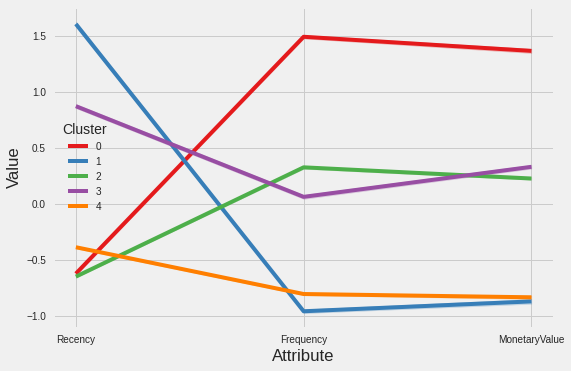

In [ ]:
sns.lineplot('Attribute', 'Value', hue='Cluster', data=df_nor_melt,palette='Set1')

In [ ]:
cluster_avg = df_std2.groupby('Cluster').mean()
population_avg = df_std2.mean()
relative_imp = cluster_avg / population_avg - 1
relative_imp.iloc[:,1:]

,Frequency,MonetaryValue,Recency
Cluster,,,
0,-3.181084e+15,-2.459592e+15,2.363120e+15
1,2.046319e+15,1.569493e+15,-6.087205e+15
2,-6.947751e+14,-4.069222e+14,2.464234e+15
3,-1.325510e+14,-5.950032e+14,-3.305008e+15
4,1.717726e+15,1.503577e+15,1.469108e+15


In [ ]:
k_means_clust_sizes = df_std2.groupby('Cluster').size().to_frame()
k_means_clust_sizes.columns = ["KM_size"]
k_means_clust_sizes

,KM_size
Cluster,
0,4286
1,3745
2,6584
3,3940
4,6443


In [ ]:
def tracer(db, n, name):
    '''
    This function returns trace object for Plotly
    '''
    return go.Scatter3d(
        x = db[db['Cluster']==n]['Frequency'],
        y = db[db['Cluster']==n]['Recency'],
        z = db[db['Cluster']==n]['MonetaryValue'],
        mode = 'markers',
        name = name,
        marker = dict(
        size = 3,  # set color to an array/list of desired values
        colorscale='Viridis', 
        )
     )

trace0 = tracer(df_std2, 0, 'Cluster 0')
trace1 = tracer(df_std2, 1, 'Cluster 1')
trace2 = tracer(df_std2, 2, 'Cluster 2')
trace3 = tracer(df_std2, 3, 'Cluster 3')
trace4 = tracer(df_std2, 4, 'Cluster 4')

data = [trace0,trace1,trace2,trace3,trace4]

layout = go.Layout(
    title = 'Clusters of K-Means',
    scene = dict(
            xaxis = dict(title = 'Frequency'),
            yaxis = dict(title = 'Recency'),
            zaxis = dict(title = 'MonetaryValue')
        )
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

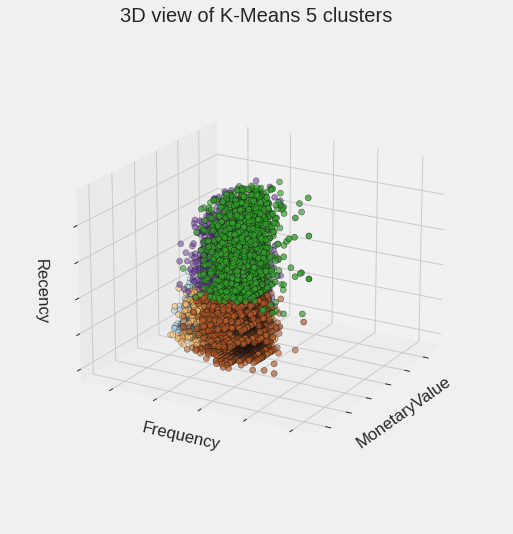

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(7, 7))
ax = Axes3D(fig, rect=[0, 0, .99, 1], elev=20, azim=210)
ax.scatter(df_std2['MonetaryValue'],
           df_std2['Frequency'],
           df_std2['Recency'],
           c=df_std2['Cluster'],
           s=35, edgecolor='k', cmap=plt.cm.Paired)

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_xlabel('MonetaryValue')
ax.set_ylabel('Frequency')
ax.set_zlabel('Recency')
ax.set_title('3D view of K-Means 5 clusters')
ax.dist = 12

plt.show()


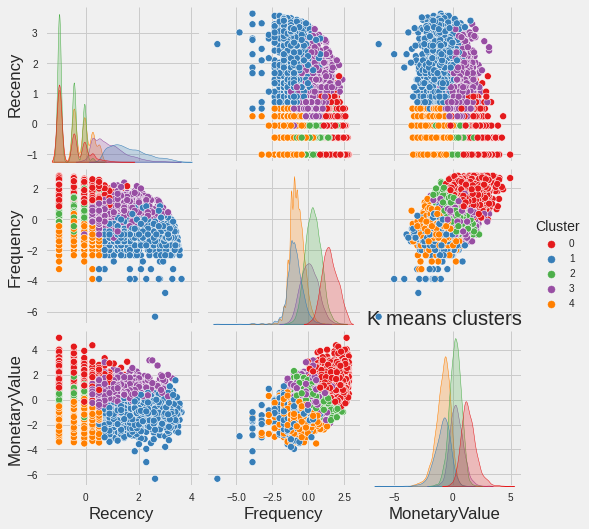

In [ ]:
sns.pairplot(df_std2, hue="Cluster",palette='Set1')
plt.title('K means clusters')
plt.show()

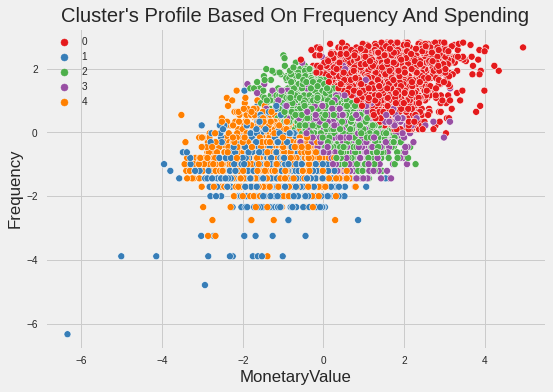

In [ ]:
pl = sns.scatterplot(data = df_std2,x=df_std2["MonetaryValue"], y=df_std2["Frequency"],hue=df_std2["Cluster"], palette= 'Set1')
pl.set_title("Cluster's Profile Based On Frequency And Spending")
plt.legend()
plt.show()

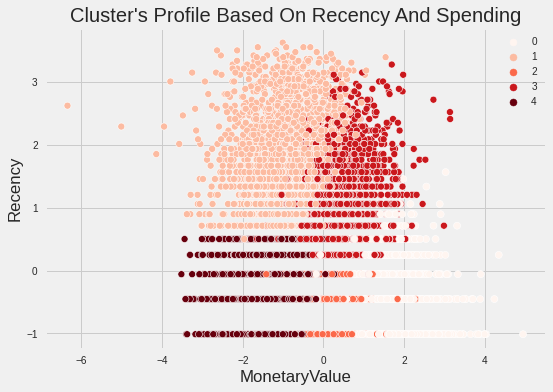

In [ ]:
pl = sns.scatterplot(data = df_std2,x=df_std2["MonetaryValue"], y=df_std2["Recency"],hue=df_std2["Cluster"], palette= 'Reds')
pl.set_title("Cluster's Profile Based On Recency And Spending")
plt.legend()
plt.show()

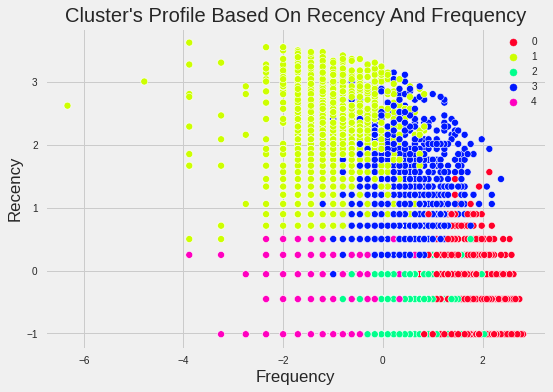

In [ ]:
pl = sns.scatterplot(data = df_std2,x=df_std2["Frequency"], y=df_std2["Recency"],hue=df_std2["Cluster"], palette= 'gist_rainbow')
pl.set_title("Cluster's Profile Based On Recency And Frequency")
plt.legend()
plt.show()

In [ ]:
#In order to understand what these numbers mean, let's perform inverse transformation
cluster_centers = scaler.inverse_transform(df_std)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [df_std.columns])
cluster_centers
# concatenate the clusters labels to our original dataframe
df_cluster = pd.concat([cluster_centers, pd.DataFrame({'Cluster':labels})], axis = 1)
df_cluster.head()
#creditcard_df_cluster.to_csv('marketing clusters.csv')

,"(Recency,)","(Frequency,)","(MonetaryValue,)",Cluster
0,0.693,3.466,6.048,5
1,1.386,3.434,5.839,6
2,2.565,2.565,3.780,9
3,1.099,3.829,4.808,4
4,0.693,3.555,6.124,5


In [ ]:
rfm_data1=rfm_data.copy()
rfm_data1['avg_order_value']=rfm_data1['MonetaryValue']/rfm_data1['Frequency']
rfm_data1.head()

,Recency,Frequency,MonetaryValue,avg_order_value
customer_id,,,,
0001496e540173a40362759ed10b3ce2,2,32,423.40,13.231250
0003b7de618c1acfc67eac91b853b287,4,31,343.35,11.075806
00045e9d1c96d7e2353f886704e51c88,13,13,43.80,3.369231
000e223791e890e85938d71bee32cf5a,3,46,122.50,2.663043
0016652ea3c3a1176dd2385e89de9ff6,2,35,456.70,13.048571


In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

def plot_kmeans(kmeans, X, n_clusters=5, rseed=0, ax=None):
    labels = kmeans.fit_predict(X)

    # plot the input data
    ax = ax or plt.gca()
    ax.axis('equal')
    ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)

    # plot the representation of the KMeans model
    centers = kmeans.cluster_centers_
    radii = [cdist(X[labels == i], [center]).max()
             for i, center in enumerate(centers)]
    for c, r in zip(centers, radii):
        ax.add_patch(plt.Circle(c, r, fc='#CCCCCC', lw=3, alpha=0.5, zorder=1))

In [ ]:
#scatter plot to display segments
import plotly.express as px
#rfm_scatter = df_std2[(df_std2['MonetaryValue']) & (df_std2['Recency']) & (df_std2['Frequency'])]
fig = px.scatter(rfm_data, x="Recency", y="Frequency", color=df_std2["Cluster"],
                 size=rfm_data['MonetaryValue'])
fig.show()

## Hierarchical clustering

In this clustering approach, we start with the cluster leaf and then move upward until the cluster root is finally obtained. Initially, this approach assumes each data point in the dataset is an independent cluster.

In the beginning, each data point is considered a single-element cluster (leaf). Since the two most similar clusters are combined at each step, we obtain fewer clusters at each current iteration than the previous iteration.

This process continues until we obtain one big cluster (root) whose elements are clusters of comparable properties.

To measure the distance between these groups of points, we need to develop a well-defined approach to enhance consistency in our clustering task.

The distance between two clusters can be taken in five different approaches. These approaches are generally known as Linkage methods. In our case we are using the Ward's distance!

Ward’s Minimum variance method: Ward distance is one of the most suitable metrics for taking distances between clusters. This method looks for the aggregate deviation. For instance, if we have two clusters, we can pretend to merge them into one cluster and then estimate the centroid of the resulting cluster. After that, we find the sum of the squared deviation for all points from the new centroid. For different merges, we shall obtain other variations. Eventually,the distance with the minimum merge is chosen.

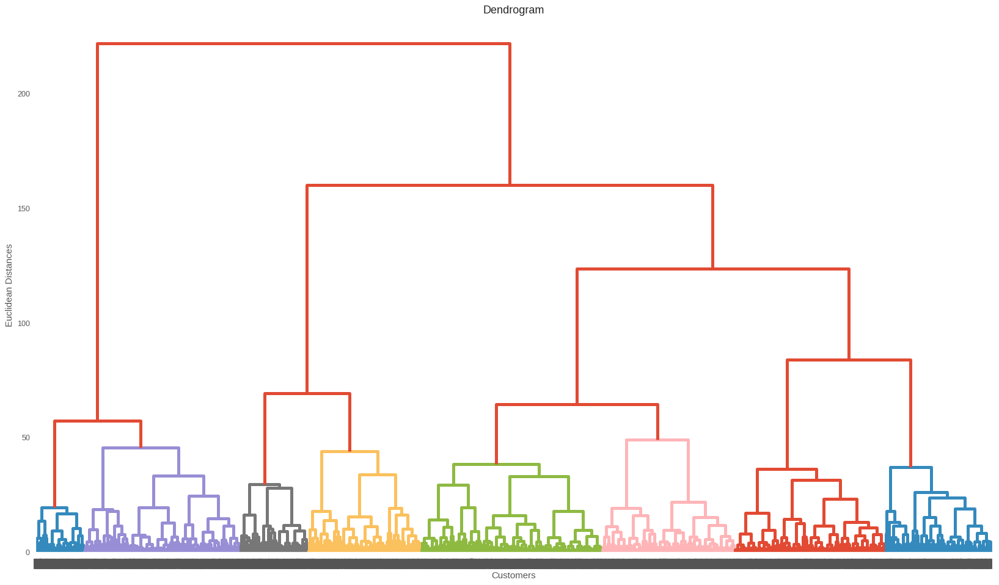

In [ ]:
# Using the Dendogram to Decide the number of clusters
plt.style.use('ggplot')
plt.figure(figsize=(20,12), dpi=90)                         # Setting the figure size
dendrogram(linkage(df_std, method='ward'), color_threshold=50)   # using ward linkage method to differ similarities
plt.title('Dendrogram')                                     # Setting the title
plt.xlabel('Customers')                                     # Setting the x label
plt.ylabel('Euclidean Distances')                           # Setting y label
plt.show()

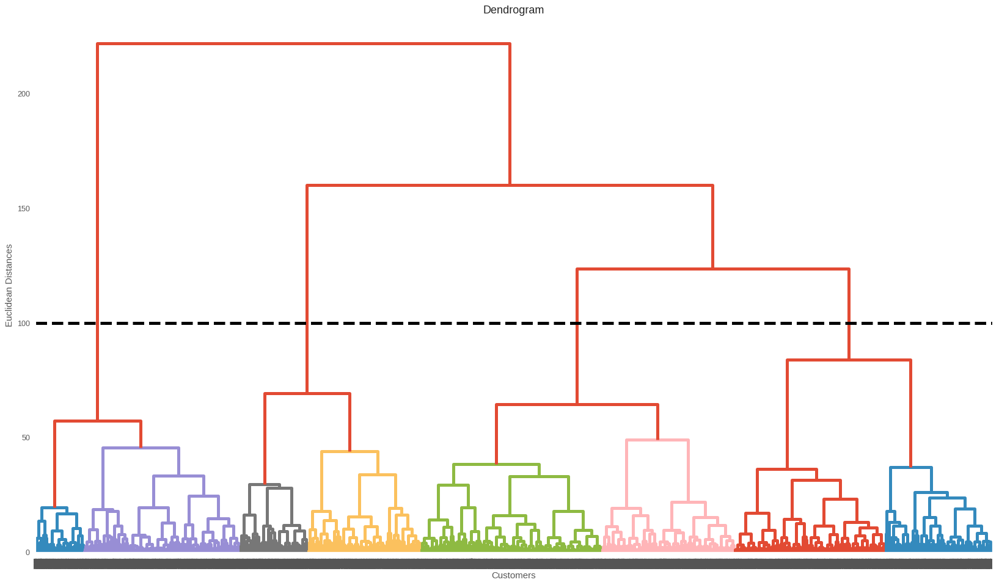

In [ ]:
# Using the Dendogram to Decide the number of clusters
plt.figure(figsize=(20,12), dpi=90)                         # Setting the figure size
dendrogram(linkage(df_std, method='ward'), color_threshold=50)   # using ward linkage method to differ similarities
plt.title('Dendrogram')                                     # Setting the title
plt.xlabel('Customers')                                     # Setting the x label
plt.ylabel('Euclidean Distances')                           # Setting y label
plt.axhline(y=100, color='black', linestyle='--')            # Setting the axis line for y=100
plt.show()

The number of clusters will be the number of vertical lines which are being intersected by the line drawn using the threshold. In the above example, since the red line intersects 4 vertical lines, we will have 4 clusters.

In [ ]:
for i in range (2,10):
    hc=AgglomerativeClustering(n_clusters= i)
    y_hc=hc.fit_predict(df_std)
    sil_score = silhouette_score (df_std, y_hc)
    print('For n=',i, 'Silhouette score is', np.round(sil_score,4))


For n= 2 Silhouette score is 0.3175
For n= 3 Silhouette score is 0.2762
For n= 4 Silhouette score is 0.2313
For n= 5 Silhouette score is 0.2133
For n= 6 Silhouette score is 0.2072
For n= 7 Silhouette score is 0.1973
For n= 8 Silhouette score is 0.1809
For n= 9 Silhouette score is 0.1634


In [ ]:
df_std3=df_std.copy()

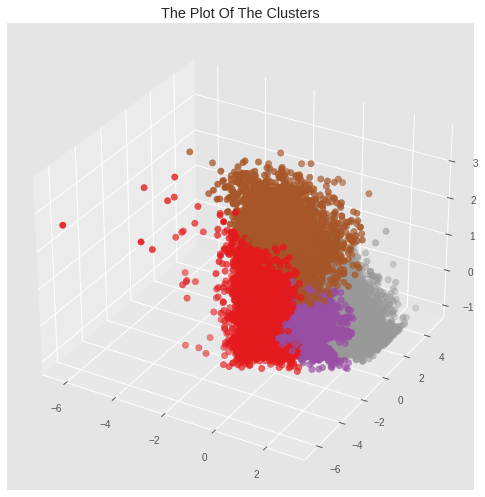

In [ ]:
'''
we need to create an AgglomerativeClustering object, and in it, we pass the following parameters:
n_cluster= 5, the number of clusters our model should return
affinity=euclidean, specify metric to be used to calculate distances
linkage= ward to regulate how distance calculation will be carried out between different clusters.
'''
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4)
# fit model and predict clusters
yhat_AC = AC.fit_predict(df_std3)
df_std3["Cluster"] = yhat_AC
#Adding the Clusters feature to the orignal dataframe.
#data["Cluster"]= yhat_AC
#To examine the clusters formed let's have a look at the 3-D distribution of the clusters.

#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(df_std3.Frequency, df_std3.MonetaryValue, df_std3.Recency, s=40, c=df_std3["Cluster"], marker='o', cmap = 'Set1' )
ax.set_title("The Plot Of The Clusters")
plt.show()

### Evaluation of Hierarchical Clustering :

In [ ]:
def tracer(db, n, name):
    '''
    This function returns trace object for Plotly
    '''
    return go.Scatter3d(
        x = db[db['Cluster']==n]['Frequency'],
        y = db[db['Cluster']==n]['Recency'],
        z = db[db['Cluster']==n]['MonetaryValue'],
        mode = 'markers',
        name = name,
        marker = dict(
        size = 3,  # set color to an array/list of desired values
        colorscale='spectral', 
        )
     )

trace0 = tracer(df_std3, 0, 'Cluster 0')
trace1 = tracer(df_std3, 1, 'Cluster 1')
trace2 = tracer(df_std3, 2, 'Cluster 2')
trace3 = tracer(df_std3, 3, 'Cluster 3')

data = [trace0,trace1,trace2,trace3]

layout = go.Layout(
    title = 'Clusters of Agglomerative Clustering',
    scene = dict(
            xaxis = dict(title = 'Frequency'),
            yaxis = dict(title = 'Recency'),
            zaxis = dict(title = 'MonetaryValue')
        )
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

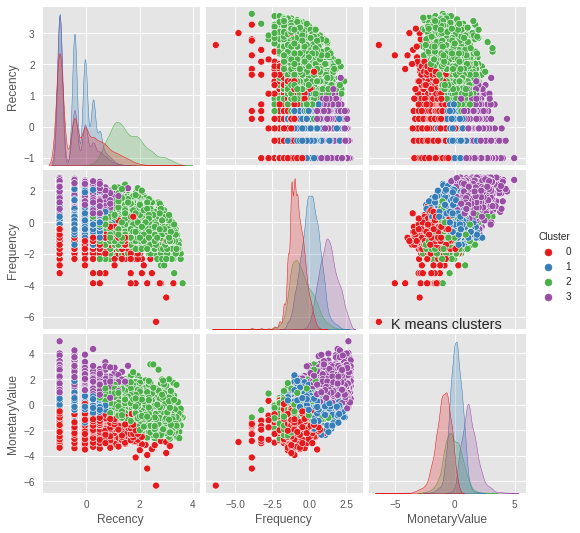

In [ ]:
sns.pairplot(df_std3, hue="Cluster",palette='Set1')
plt.title('K means clusters')
plt.show()

In [ ]:
# We create a new data frame with the original features and add a new column with the assigned clusters for each point.
df_std4=df_std3.copy()
df_std4['ID'] = df_std4.index
# df_normalized['Cluster'] = model.labels_
df_std4.head()

,Recency,Frequency,MonetaryValue,Cluster,ID
customer_id,,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,3,0001496e540173a40362759ed10b3ce2
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,3,0003b7de618c1acfc67eac91b853b287
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,0,00045e9d1c96d7e2353f886704e51c88
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,1,000e223791e890e85938d71bee32cf5a
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,3,0016652ea3c3a1176dd2385e89de9ff6


In [ ]:
# Melt The Data
df_nor_melt3 = pd.melt(df_std4.reset_index(),
                      id_vars=['ID', 'Cluster'],
                      value_vars=['Recency','Frequency','MonetaryValue'],
                      var_name='Attribute',
                      value_name='Value')
df_nor_melt3.head()

,ID,Cluster,Attribute,Value
0,0001496e540173a40362759ed10b3ce2,3,Recency,-1.012180
1,0003b7de618c1acfc67eac91b853b287,3,Recency,-0.057881
2,00045e9d1c96d7e2353f886704e51c88,0,Recency,1.565666
3,000e223791e890e85938d71bee32cf5a,1,Recency,-0.453096
4,0016652ea3c3a1176dd2385e89de9ff6,3,Recency,-1.012180


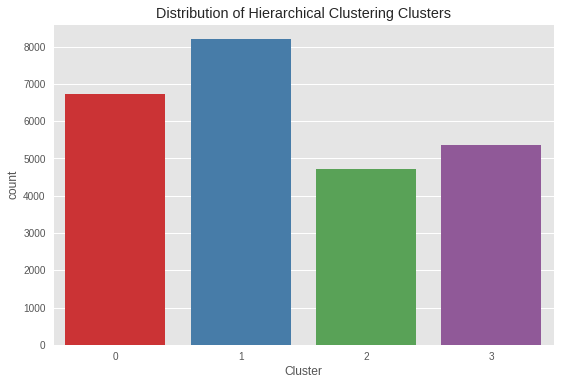

In [ ]:
#Plotting countplot of clusters
pl = sns.countplot(x=df_std3["Cluster"], palette= 'Set1',)
pl.set_title("Distribution of Hierarchical Clustering Clusters")
plt.show()

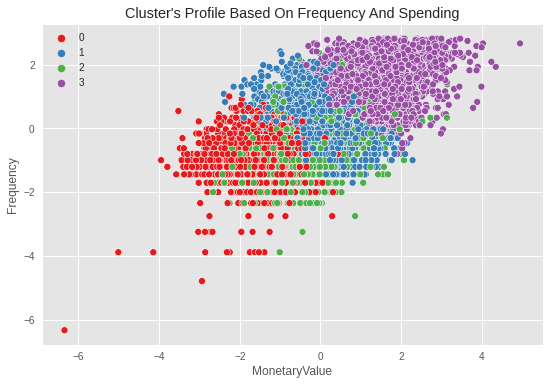

In [ ]:
pl = sns.scatterplot(data = df_std3,x=df_std3["MonetaryValue"], y=df_std3["Frequency"],hue=df_std3["Cluster"], palette= 'Set1')
pl.set_title("Cluster's Profile Based On Frequency And Spending")
plt.legend()
plt.show()

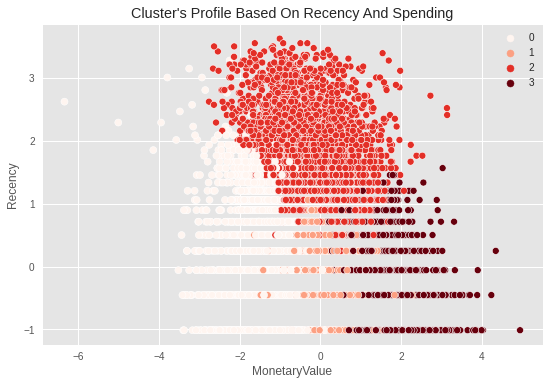

In [ ]:
pl = sns.scatterplot(data = df_std3,x=df_std3["MonetaryValue"], y=df_std3["Recency"],hue=df_std3["Cluster"], palette= 'Reds')
pl.set_title("Cluster's Profile Based On Recency And Spending")
plt.legend()
plt.show()

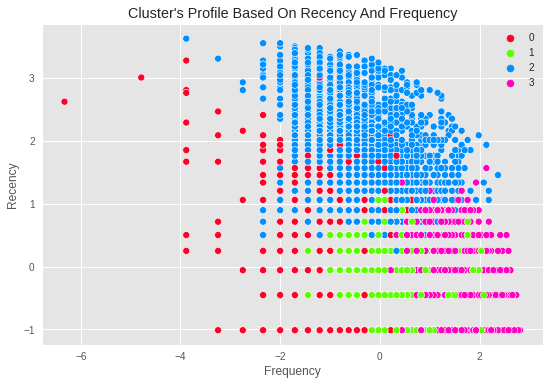

In [ ]:
pl = sns.scatterplot(data = df_std3,x=df_std3["Frequency"], y=df_std3["Recency"],hue=df_std3["Cluster"], palette= 'gist_rainbow')
pl.set_title("Cluster's Profile Based On Recency And Frequency")
plt.legend()
plt.show()

In [ ]:
#scatter plot to display segments
import plotly.express as px
rfm_scatter = df_std3[(df_std3['MonetaryValue'] > 0) & (df_std3['Recency'] <=360) & (df_std3['Frequency'])]
fig = px.scatter(rfm_scatter, x="Recency", y="Frequency", color="Cluster",
                 size='MonetaryValue')
fig.show()

<AxesSubplot:xlabel='Attribute', ylabel='Value'>

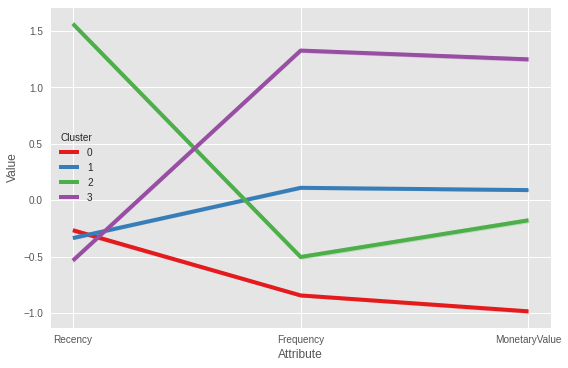

In [ ]:
sns.lineplot('Attribute', 'Value', hue='Cluster', data=df_nor_melt3,palette='Set1')

In [ ]:
# calculate the Silhouette Coefficient
sil_score = silhouette_score(df_std, yhat_AC)
print(f"Silhouette Coefficient for Agglomerative Clustering model with (k=4): {sil_score:.4f}")

# calculate the Calinski-Harabasz Index
ch_score = calinski_harabasz_score(df_std, yhat_AC)
print(f"Calinski-Harabasz Index for Agglomerative Clustering model with (k=4): {ch_score:.4f}")

# calculate the Davies-Bouldin Index
db_score = davies_bouldin_score(df_std, yhat_AC)
print(f"Davies-Bouldin Index for Agglomerative Clustering model with (k=4): {db_score:.4f}\n")

Silhouette Coefficient for Agglomerative Clustering model with (k=4): 0.2313
Calinski-Harabasz Index for Agglomerative Clustering model with (k=4): 12560.2492
Davies-Bouldin Index for Agglomerative Clustering model with (k=4): 1.2222



##DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a density-based unsupervised learning algorithm. It computes nearest neighbor graphs to find arbitrary-shaped clusters and outliers.

DBSCAN does not require K clusters initially. Instead, it requires two parameters: eps and minPts.

1. eps: it is the radius of specific neighborhoods. If the distance between two points is less than or equal to esp, it will be considered its neighbors.

2. minPts: minimum number of data points in a given neighborhood to form the clusters. 

DBSCAN uses these two parameters to define a core point, border point, or outlier

In [ ]:
from sklearn.cluster import DBSCAN

1. MinPoints: We can obtain the minimum number of Points to be used to recognize a cluster, as follows:
If the dataset has two dimensions, use the min sample per cluster as 4.
If the data has more than two dimensions, the min sample per cluster should be: 

Min_sample(MinPoints) = 2 * Data dimension

Since our data is two-dimensional, we shall use the default value of 4 as our MinPoint parameter.

Epsilon (Eps): To calculate the value of Eps, we shall calculate the distance between each data point to its closest neighbor using the Nearest Neighbours. After that, we sort them and finally plot them. From the plot, we identify the maximum value at the curvature of the graph. This value is our Eps.

Compute data proximity from each other using Nearest Neighbours


In [ ]:
df_std5=df_std.copy()
df_std5.head()

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521


In [ ]:
from sklearn.neighbors import NearestNeighbors # importing the library
nr_neigh = NearestNeighbors(n_neighbors=6) # creating an object of the NearestNeighbors class
nbrs=nr_neigh.fit(df_std5) # fitting the data to the object
distances,indices=nbrs.kneighbors(df_std5) # f

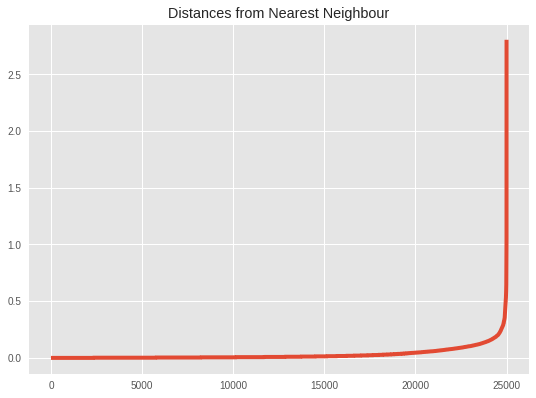

In [ ]:
# Sort and plot the distances results
distances = np.sort(distances, axis = 0) # sorting the distances
distances = distances[:, 1] # taking the second column of the sorted distances
plt.rcParams['figure.figsize'] = (8,6) # setting the figure size
plt.plot(distances) # plotting the distances
plt.title('Distances from Nearest Neighbour')
plt.show() 

In [ ]:
eps = np.arange(0.2,1.5,0.1) 
min_samples = np.arange(2,6) 
dbscan_params = list(product(eps, min_samples))
no_of_clusters = []
sil_score = []
epsvalues = []
min_samp = []
for p in dbscan_params:
    dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(df_std)
    epsvalues.append(p[0])
    min_samp.append(p[1])
    no_of_clusters.append(len(np.unique(dbscan_cluster.labels_)))
    sil_score.append(silhouette_score(df_std, dbscan_cluster.labels_))
eps_min = list(zip(no_of_clusters, sil_score, epsvalues, min_samp))
eps_min_df = pd.DataFrame(eps_min, columns=['No_of_clusters', 'Silhouette_score', 'Epsilon_values', 'Minimum_points'])

In [ ]:
eps_min_df

,No_of_clusters,Silhouette_score,Epsilon_values,Minimum_points
0,279,-0.301491,0.2,2
1,140,-0.304141,0.2,3
2,95,-0.275752,0.2,4
3,71,-0.283752,0.2,5
4,53,-0.196391,0.3,2
5,21,-0.114126,0.3,3
6,13,-0.070783,0.3,4
7,11,-0.050420,0.3,5
8,15,0.009524,0.4,2
9,8,0.035655,0.4,3


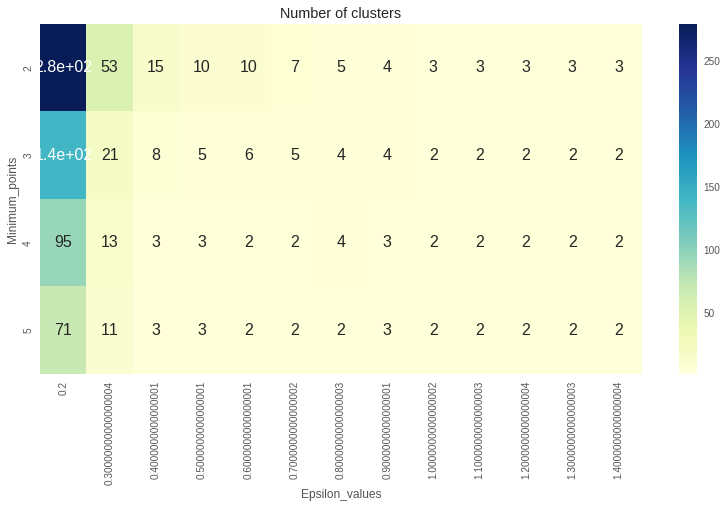

In [ ]:
eps_min_df['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(eps_min_df, values='No_of_clusters', index='Minimum_points', columns='Epsilon_values')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

From the above plot, we note the maximum curvature of the curve is about eight, and thus we picked our Eps as 6.

We now have our two parameters as:

MinPoints = 6
Eps = 0.3


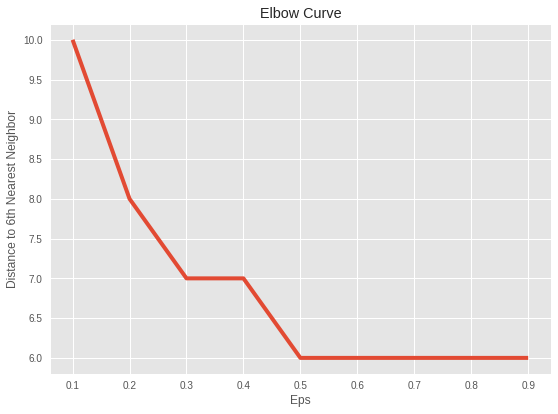

In [ ]:
# Calculate distances
distances = []

for i in np.arange(0.1, 1, 0.1):
    dbscan = DBSCAN(eps=i, min_samples=6)
    dbscan.fit(df_std)
    distances.append(np.sort(dbscan.core_sample_indices_)[6])

# Plot elbow curve
plt.plot( np.arange(0.1, 1, 0.1), distances)
plt.xlabel('Eps')
plt.ylabel('Distance to 6th Nearest Neighbor')
plt.title('Elbow Curve')
plt.show()

In [ ]:
# db_cluster = DBSCAN(eps=13, min_samples=6, algorithm='ball_tree', metric='minkowski', leaf_size=90, p=2)
# arr = db_cluster.fit_predict(df_std5)
# uni, counts = np.unique(arr, return_counts=True)
# d = dict(zip(uni, counts))
# d


In [ ]:
db5=DBSCAN(eps=0.5, min_samples=6, metric='euclidean')
db5.fit_predict(df_std5)

array([0, 1, 1, ..., 1, 0, 1])

In [ ]:
# clustering = DBSCAN(eps=12.5, min_samples=4).fit(df_std5)
df_std5.loc[:,'Cluster'] = db5.labels_ 
df_std5

,Recency,Frequency,MonetaryValue,Cluster
customer_id,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,0
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,1
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,1
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,1
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,0
...,...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,-0.453096,-0.802630,0.322625,1
fff262fbc647360700cee69566e26989,-0.453096,-0.624766,-0.184184,1
fff355794e97eaaf07f53f4fdb4d0cd2,-0.453096,-0.460241,0.498833,1


In [ ]:
df_std5.Cluster.value_counts().to_frame()


,Cluster
1,17033
0,7892
-1,73


### Evaluation of DBSCAN model

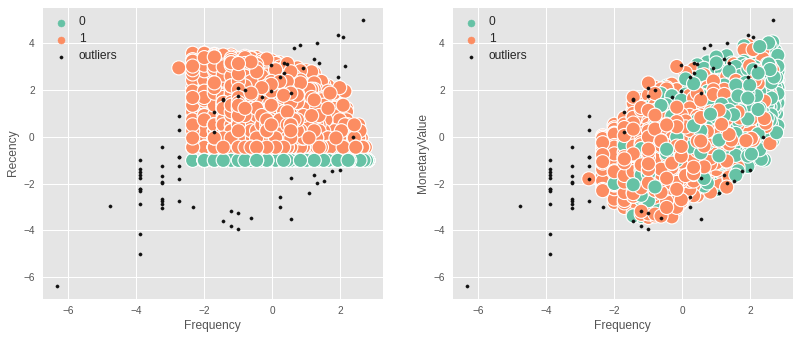

In [ ]:
outliers = df_std5[df_std5['Cluster']==-1]

fig2, (axes) = plt.subplots(1,2,figsize=(12,5))

sns.scatterplot('Frequency', 'Recency',

                data=df_std5[df_std5['Cluster']!=-1],

                hue='Cluster', ax=axes[0], palette='Set2', legend='full', s=200)

sns.scatterplot('Frequency', 'MonetaryValue',

                data=df_std5[df_std5['Cluster']!=-1],

                hue='Cluster', palette='Set2', ax=axes[1], legend='full', s=200)

axes[0].scatter(outliers['Frequency'], outliers['MonetaryValue'], s=10, label='outliers', c="k")

axes[1].scatter(outliers['Frequency'], outliers['MonetaryValue'], s=10, label='outliers', c="k")
axes[0].legend()
axes[1].legend()

plt.setp(axes[0].get_legend().get_texts(), fontsize='12')
plt.setp(axes[1].get_legend().get_texts(), fontsize='12')

plt.show()

In [ ]:
# calculate the Silhouette Coefficient
sil_score = silhouette_score(df_std, db5.labels_)
print(f"Silhouette Coefficient for DBSCAN model with (k=9): {sil_score:.4f}")

# calculate the Calinski-Harabasz Index
ch_score = calinski_harabasz_score(df_std, db5.labels_)
print(f"Calinski-Harabasz Index for DBSCAN model with (k=9): {ch_score:.4f}")

# calculate the Davies-Bouldin Index
db_score = davies_bouldin_score(df_std, db5.labels_)
print(f"Davies-Bouldin Index for DBSCAN model with (k=9): {db_score:.4f}\n")

Silhouette Coefficient for DBSCAN model with (k=9): 0.1896
Calinski-Harabasz Index for DBSCAN model with (k=9): 3042.9561
Davies-Bouldin Index for DBSCAN model with (k=9): 2.8506



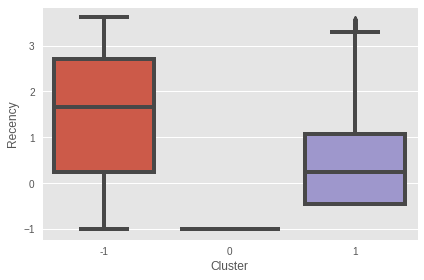

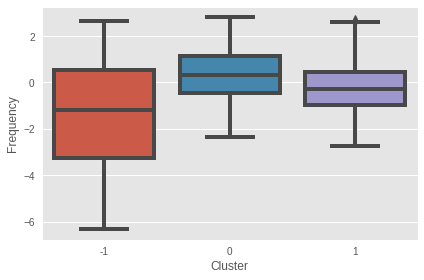

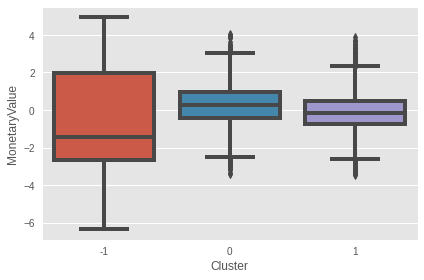

In [ ]:
for c in df_std5.columns[:-1]:
    plt.figure(figsize=(6,4))
    sns.boxplot(data=df_std5, y=c, x='Cluster')
    plt.show()

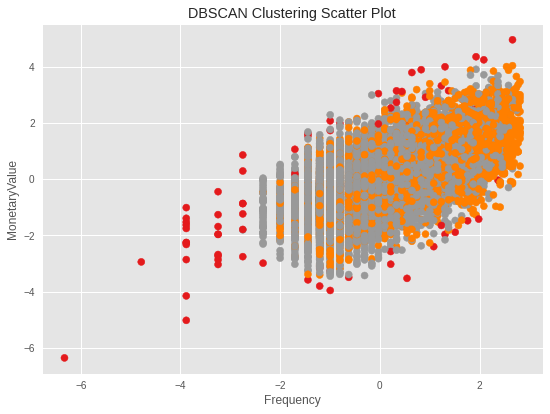

In [ ]:
# Method 1: Scatter plot
plt.scatter(df_std5['Frequency'], df_std5['MonetaryValue'], c=db5.labels_,cmap='Set1')
plt.xlabel('Frequency')
plt.ylabel('MonetaryValue')
plt.title('DBSCAN Clustering Scatter Plot')
plt.show()

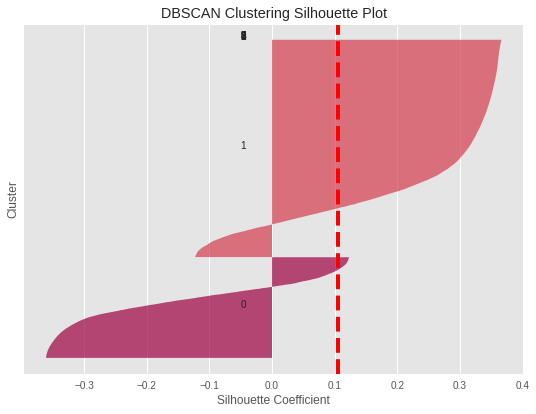

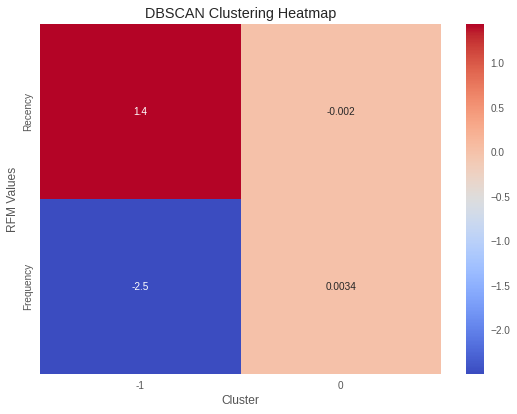

In [ ]:
# Method 2: Silhouette plot
silhouette = silhouette_score(rfm_data, db5.labels_)
silhouette_values = silhouette_samples(rfm_data,  db5.labels_)
y_lower = 10
for i in range(10):
    ith_cluster_silhouette_values = silhouette_values[ db5.labels_ == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = plt.cm.Spectral(float(i) / 10)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

plt.axvline(x=silhouette, color="red", linestyle="--")
plt.yticks([])
plt.ylabel("Cluster")
plt.xlabel("Silhouette Coefficient")
plt.title('DBSCAN Clustering Silhouette Plot')
plt.show()


# Method 3: Heatmap
df_std5['Cluster'] = clusters
clustered_data = df_std5.groupby('Cluster').mean().iloc[:, :-1]
sns.heatmap(clustered_data.T, cmap='coolwarm', annot=True)
plt.title('DBSCAN Clustering Heatmap')
plt.xlabel('Cluster')
plt.ylabel('RFM Values')
plt.show()


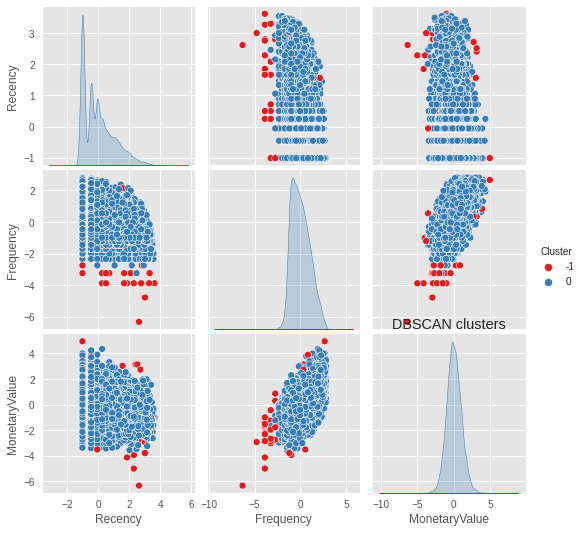

In [ ]:
sns.pairplot(df_std5, hue="Cluster",palette='Set1')
plt.title('DBSCAN clusters')
plt.show()

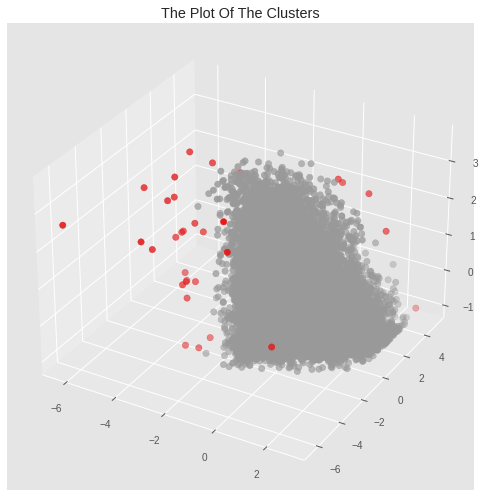

In [ ]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(df_std3.Frequency, df_std5.MonetaryValue, df_std5.Recency, s=40, c=df_std5["Cluster"], marker='o', cmap = 'Set1' )
ax.set_title("The Plot Of The Clusters")
plt.show()

In [ ]:
def tracer(db, n, name):
    '''
    This function returns trace object for Plotly
    '''
    return go.Scatter3d(
        x = db[db['Cluster']==n]['Frequency'],
        y = db[db['Cluster']==n]['Recency'],
        z = db[db['Cluster']==n]['MonetaryValue'],
        mode = 'markers',
        name = name,
        marker = dict(
        size = 3,  # set color to an array/list of desired values
        colorscale='spectral', 
        )
     )

trace0 = tracer(df_std5, 0, 'Cluster 0')
trace1 = tracer(df_std5, 1, 'Cluster 1')

data = [trace0,trace1]

layout = go.Layout(
    title = 'Clusters of DBSCAN',
    scene = dict(
            xaxis = dict(title = 'Frequency'),
            yaxis = dict(title = 'Recency'),
            zaxis = dict(title = 'MonetaryValue')
        )
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
# We create a new data frame with the original features and add a new column with the assigned clusters for each point.
df_std6=df_std5.copy()
df_std6['ID'] = df_std5.index
# df_normalized['Cluster'] = model.labels_
df_std6.head()

,Recency,Frequency,MonetaryValue,Cluster,ID
customer_id,,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,0,0001496e540173a40362759ed10b3ce2
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,0,0003b7de618c1acfc67eac91b853b287
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,0,00045e9d1c96d7e2353f886704e51c88
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,0,000e223791e890e85938d71bee32cf5a
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,0,0016652ea3c3a1176dd2385e89de9ff6


In [ ]:
# Melt The Data
df_nor_melt6 = pd.melt(df_std6.reset_index(),
                      id_vars=['ID', 'Cluster'],
                      value_vars=['Recency','Frequency','MonetaryValue'],
                      var_name='Attribute',
                      value_name='Value')
df_nor_melt6.head()

,ID,Cluster,Attribute,Value
0,0001496e540173a40362759ed10b3ce2,0,Recency,-1.012180
1,0003b7de618c1acfc67eac91b853b287,0,Recency,-0.057881
2,00045e9d1c96d7e2353f886704e51c88,0,Recency,1.565666
3,000e223791e890e85938d71bee32cf5a,0,Recency,-0.453096
4,0016652ea3c3a1176dd2385e89de9ff6,0,Recency,-1.012180


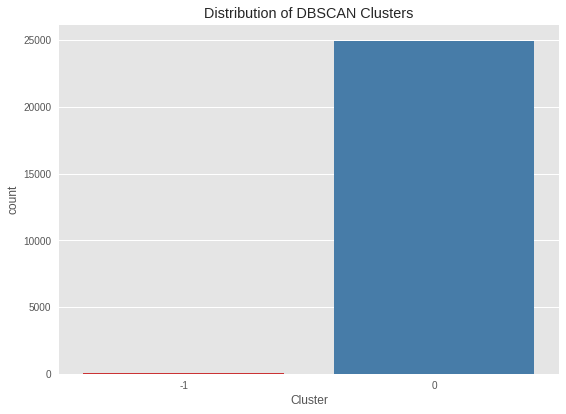

In [ ]:
#Plotting countplot of clusters
pl = sns.countplot(x=df_std5["Cluster"], palette= 'Set1',)
pl.set_title("Distribution of DBSCAN Clusters")
plt.show()

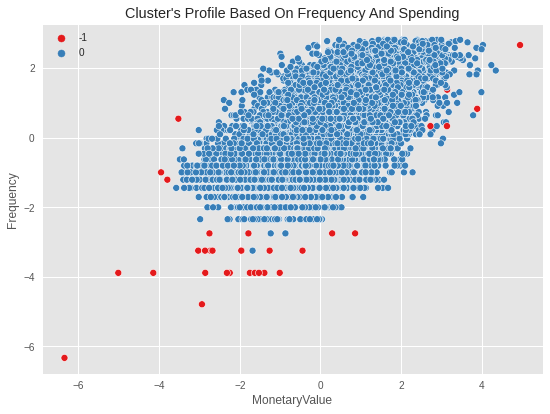

In [ ]:
pl = sns.scatterplot(data = df_std5,x=df_std5["MonetaryValue"], y=df_std5["Frequency"],hue=df_std5["Cluster"], palette= 'Set1')
pl.set_title("Cluster's Profile Based On Frequency And Spending")
plt.legend()
plt.show()

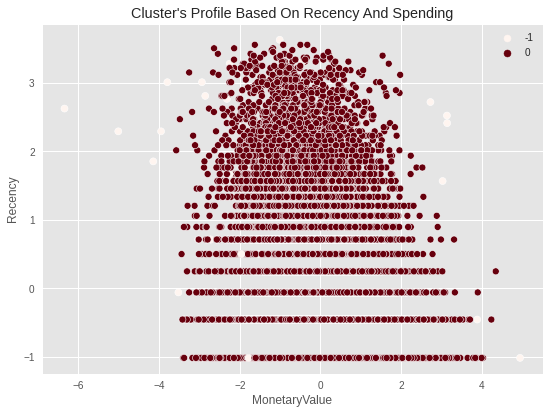

In [ ]:
pl = sns.scatterplot(data = df_std5,x=df_std5["MonetaryValue"], y=df_std5["Recency"],hue=df_std5["Cluster"], palette= 'Reds')
pl.set_title("Cluster's Profile Based On Recency And Spending")
plt.legend()
plt.show()

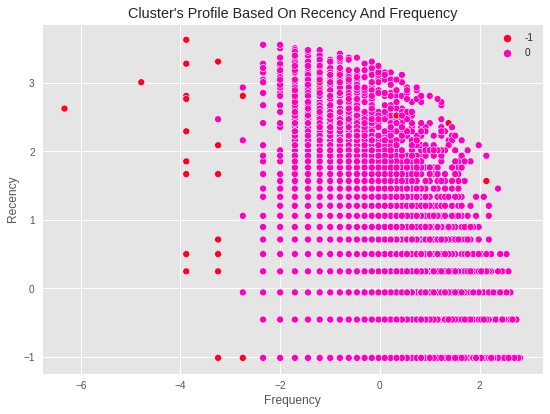

In [ ]:
pl = sns.scatterplot(data = df_std5,x=df_std5["Frequency"], y=df_std5["Recency"],hue=df_std5["Cluster"], palette= 'gist_rainbow')
pl.set_title("Cluster's Profile Based On Recency And Frequency")
plt.legend()
plt.show()

## Gaussian Mixture Model

Gaussian Mixture Model are probability distribution models. Clusters modeled are Gaussians. It is a “soft-clustering” method which means that “instead of putting each data point into a separate cluster, a probability or likelihood of that data point to be in those clusters is assigned”(Link)

The parameters to fit the data are :



1.  Mean
2.  Covariance
3.  Mixing coefficient











In [ ]:
lowest_bic = np.infty
bic = []
n_components_range = range(1, 10)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        gmm = GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type, random_state=42)
        gmm.fit(df_std)
        bic.append(gmm.bic(df_std))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

In [ ]:
print('Best covariance type:', best_gmm.covariance_type)



Best covariance type: full


In [ ]:
from matplotlib.patches import Ellipse
from scipy import linalg

In [ ]:
from sklearn.mixture import GaussianMixture

In [ ]:
from sklearn.model_selection import GridSearchCV


def gmm_bic_score(estimator, df_std):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(df_std)


param_grid = {
    "n_components": range(1, 10),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(), param_grid=param_grid, scoring=gmm_bic_score,return_train_score=True
)
grid_search.fit(df_std)

GridSearchCV(estimator=GaussianMixture(),
             param_grid={'covariance_type': ['spherical', 'tied', 'diag',
                                             'full'],
                         'n_components': range(1, 10)},
             return_train_score=True,
             scoring=<function gmm_bic_score at 0x7f84eca4bd30>)

In [ ]:
gc = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
# gc["mean_test_score"] = -df["mean_test_score"]
gc = gc.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
gc.sort_values(by="BIC score").head()

,Number of components,Type of covariance,BIC score
18,1,diag,-42618.068588
0,1,spherical,-42600.286584
1,2,spherical,-40026.142592
19,2,diag,-39138.465091
27,1,full,-38949.080039


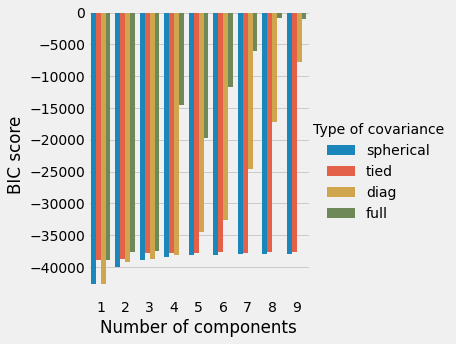

In [ ]:
sns.catplot(
    data=gc,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
)
plt.show()

TypeError: ignored

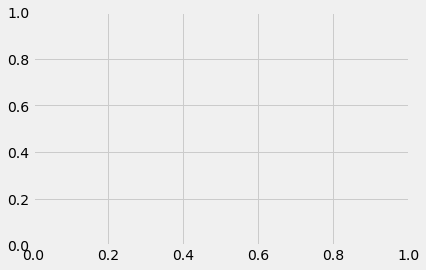

In [ ]:
color_iter = sns.color_palette("tab10", 2)[::-1]
Y_ = grid_search.predict(df_std)

fig, ax = plt.subplots()

for i, (mean, cov, color) in enumerate(
    zip(
        grid_search.best_estimator_.means_,
        grid_search.best_estimator_.covariances_,
        color_iter,
    )
):
    v, w = linalg.eigh(cov)
    if not np.any(Y_ == i):
        continue
    plt.scatter(df_std[Y_ == i, 0], X[Y_ == i, 1], 0.8, color=color)

    angle = np.arctan2(w[0][1], w[0][0])
    angle = 180.0 * angle / np.pi  # convert to degrees
    v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
    ellipse = Ellipse(mean, v[0], v[1], angle=180.0 + angle, color=color)
    ellipse.set_clip_box(fig.bbox)
    ellipse.set_alpha(0.5)
    ax.add_artist(ellipse)

plt.title(
    f"Selected GMM: {grid_search.best_params_['covariance_type']} model, "
    f"{grid_search.best_params_['n_components']} components"
)
plt.axis("equal")
plt.show()


In [ ]:
df_std7=df_std.copy()
df_std7.head()

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521


In [ ]:
# Gaussian Mixture Model Clustering
gmm = GaussianMixture(n_components=4,covariance_type='diag', random_state=42)
gmm.fit(df_std7)
# Predict cluster labels
gmm_labels = gmm.predict(df_std7)

In [ ]:
probs = gmm.predict_proba(df_std)
print(probs[:5].round(3))

[[0.037 0.    0.963 0.   ]
 [0.314 0.001 0.685 0.   ]
 [0.    0.993 0.    0.007]
 [0.125 0.001 0.875 0.   ]
 [0.013 0.    0.987 0.   ]]


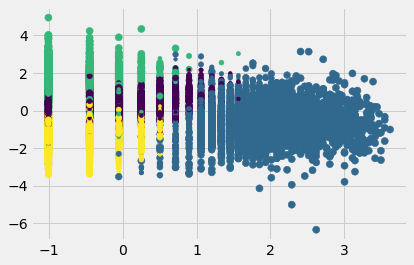

In [ ]:
size = 50 * probs.max(1) ** 2  # square emphasizes differences
plt.scatter(df_std['Recency'], df_std['MonetaryValue'], c=gmm_labels, cmap='viridis', s=size);

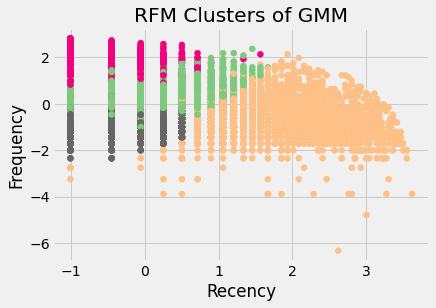

In [ ]:
# Add the cluster labels to the original dataset
df_std7['Cluster'] = gmm_labels

# Visualize the clusters
plt.scatter(df_std7['Recency'], df_std7['Frequency'], c=gmm_labels,cmap='Accent')
plt.xlabel('Recency')
plt.ylabel('Frequency')
plt.title('RFM Clusters of GMM')
plt.show()



In [ ]:
df_std7.Cluster.value_counts()

0    9054
3    6468
1    5499
2    3977
Name: Cluster, dtype: int64

### Evaluation of GMM

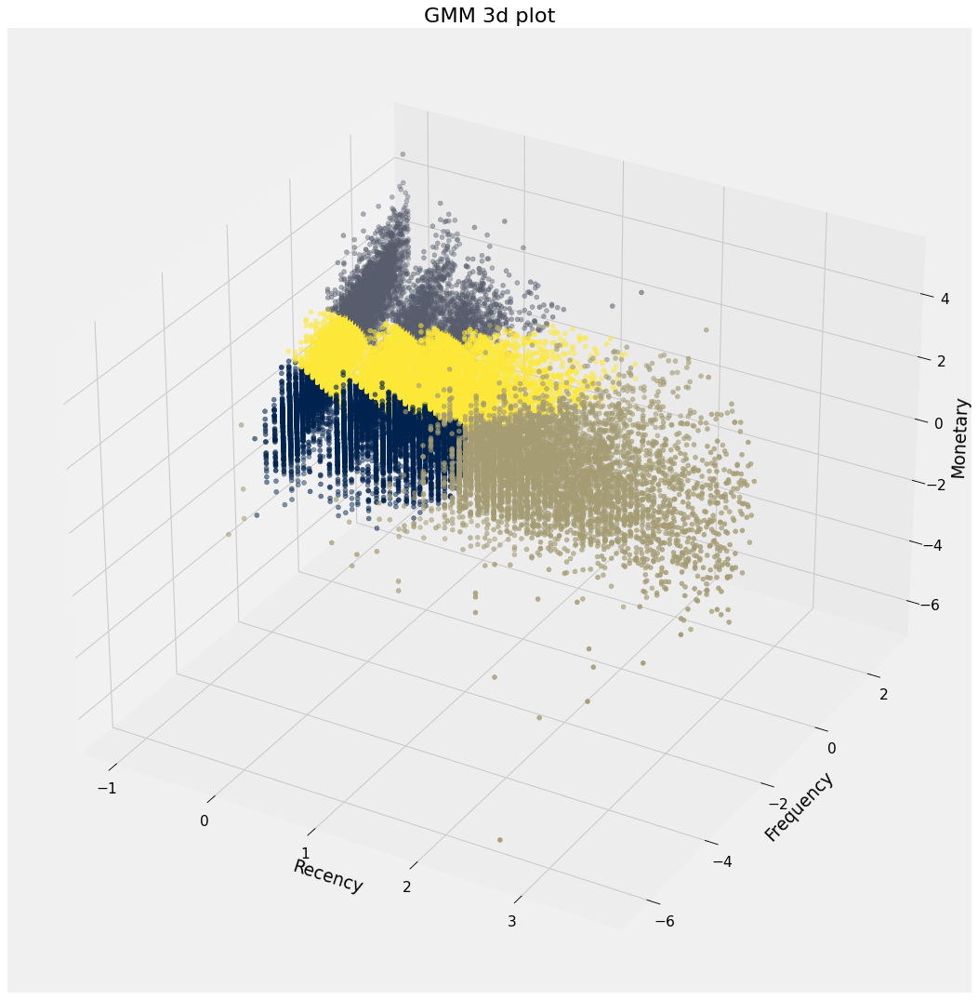

In [ ]:
def three_d_plot(data1,data2,data3,data4):
    from mpl_toolkits.mplot3d import Axes3D
    fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data1,data2,data3, c=data4, cmap='cividis_r')
    plt.title("GMM 3d plot")
    ax.set_xlabel('Recency')
    ax.set_ylabel('Frequency')
    ax.set_zlabel('Monetary')
    plt.show()

three_d_plot(df_std7["Recency"],df_std7["Frequency"],df_std7["MonetaryValue"],df_std7["Cluster"])

In [ ]:
# calculate the Silhouette Coefficient
sil_score = silhouette_score(df_std, gmm_labels)
print(f"Silhouette Coefficient for GMM model with (k=4): {sil_score:.4f}")

# calculate the Calinski-Harabasz Index
ch_score = calinski_harabasz_score(df_std, gmm_labels)
print(f"Calinski-Harabasz Index for GMM model with (k=4): {ch_score:.4f}")

# calculate the Davies-Bouldin Index
db_score = davies_bouldin_score(df_std, gmm_labels)
print(f"Davies-Bouldin Index for GMM model with (k=4): {db_score:.4f}\n")

Silhouette Coefficient for GMM model with (k=4): 0.2757
Calinski-Harabasz Index for GMM model with (k=4): 14560.3685
Davies-Bouldin Index for GMM model with (k=4): 1.0999



In [ ]:
def tracer(db, n, name):
    '''
    This function returns trace object for Plotly
    '''
    return go.Scatter3d(
        x = db[db['Cluster']==n]['Frequency'],
        y = db[db['Cluster']==n]['Recency'],
        z = db[db['Cluster']==n]['MonetaryValue'],
        mode = 'markers',
        name = name,
        marker = dict(
        size = 3,  # set color to an array/list of desired values
        colorscale='spectral', 
        )
     )

trace0 = tracer(df_std7, 0, 'Cluster 0')
trace1 = tracer(df_std7, 1, 'Cluster 1')
trace2 = tracer(df_std7, 2, 'Cluster 2')
trace3 = tracer(df_std7, 3, 'Cluster 3')

data = [trace0,trace1,trace2,trace3]

layout = go.Layout(
    title = 'Clusters of GMM',
    scene = dict(
            xaxis = dict(title = 'Frequency'),
            yaxis = dict(title = 'Recency'),
            zaxis = dict(title = 'MonetaryValue')
        )
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

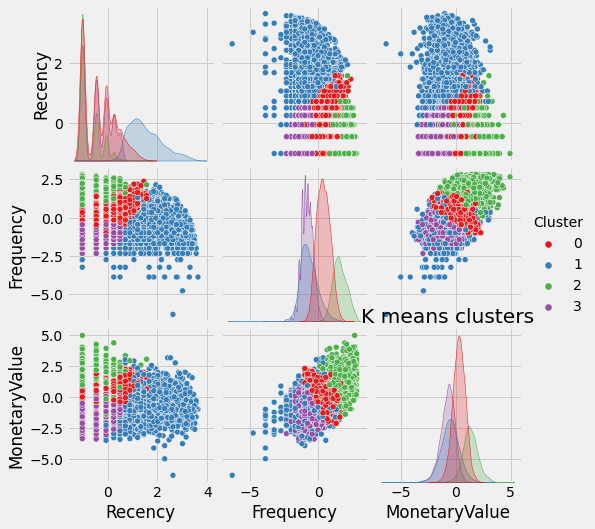

In [ ]:
sns.pairplot(df_std7, hue="Cluster",palette='Set1')
plt.title('K means clusters')
plt.show()

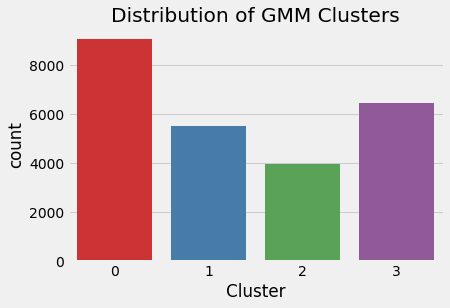

In [ ]:
#Plotting countplot of clusters
pl = sns.countplot(x=df_std7["Cluster"], palette= 'Set1',)
pl.set_title("Distribution of GMM Clusters")
plt.show()

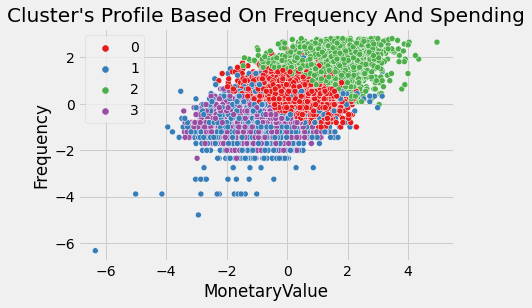

In [ ]:
pl = sns.scatterplot(data = df_std7,x=df_std7["MonetaryValue"], y=df_std7["Frequency"],hue=df_std7["Cluster"], palette= 'Set1')
pl.set_title("Cluster's Profile Based On Frequency And Spending")
plt.legend()
plt.show()

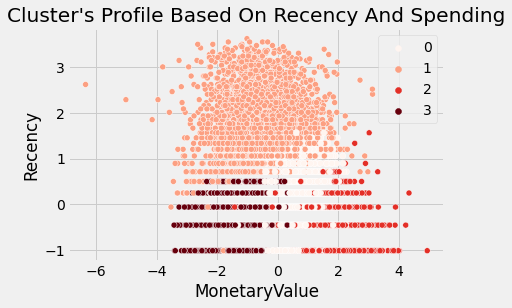

In [ ]:
pl = sns.scatterplot(data = df_std7,x=df_std7["MonetaryValue"], y=df_std7["Recency"],hue=df_std7["Cluster"], palette= 'Reds')
pl.set_title("Cluster's Profile Based On Recency And Spending")
plt.legend()
plt.show()

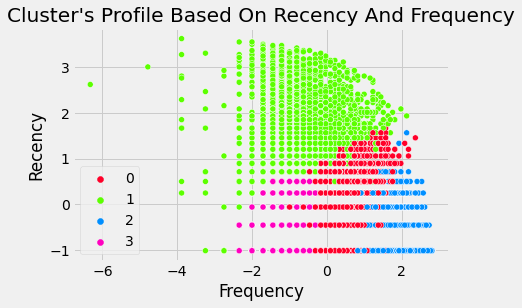

In [ ]:
pl = sns.scatterplot(data = df_std7,x=df_std7["Frequency"], y=df_std7["Recency"],hue=df_std7["Cluster"], palette= 'gist_rainbow')
pl.set_title("Cluster's Profile Based On Recency And Frequency")
plt.legend()
plt.show()

In [ ]:
# We create a new data frame with the original features and add a new column with the assigned clusters for each point.
df_std8=df_std7.copy()
df_std8['ID'] = df_std7.index
# df_normalized['Cluster'] = model.labels_
df_std8.head()

,Recency,Frequency,MonetaryValue,Cluster,ID
customer_id,,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,2,0001496e540173a40362759ed10b3ce2
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,2,0003b7de618c1acfc67eac91b853b287
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,1,00045e9d1c96d7e2353f886704e51c88
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,2,000e223791e890e85938d71bee32cf5a
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,2,0016652ea3c3a1176dd2385e89de9ff6


In [ ]:
# Melt The Data
df_nor_melt8 = pd.melt(df_std8.reset_index(),
                      id_vars=['ID', 'Cluster'],
                      value_vars=['Recency','Frequency','MonetaryValue'],
                      var_name='Attribute',
                      value_name='Value')
df_nor_melt8.head()

,ID,Cluster,Attribute,Value
0,0001496e540173a40362759ed10b3ce2,2,Recency,-1.012180
1,0003b7de618c1acfc67eac91b853b287,2,Recency,-0.057881
2,00045e9d1c96d7e2353f886704e51c88,1,Recency,1.565666
3,000e223791e890e85938d71bee32cf5a,2,Recency,-0.453096
4,0016652ea3c3a1176dd2385e89de9ff6,2,Recency,-1.012180


<AxesSubplot:xlabel='Attribute', ylabel='Value'>

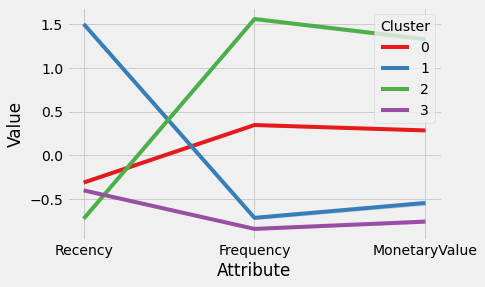

In [ ]:
sns.lineplot('Attribute', 'Value', hue='Cluster', data=df_nor_melt8,palette='Set1')

## OPTICS


OPTICS (Ordering Points To Identify the Clustering Structure) is a density-based clustering algorithm, similar to DBSCAN (Density-Based Spatial Clustering of Applications with Noise), but it can extract clusters of varying densities and shapes. It is useful for identifying clusters of different densities in large, high-dimensional datasets.

The main idea behind OPTICS is to extract the clustering structure of a dataset by identifying the density-connected points. The algorithm builds a density-based representation of the data by creating an ordered list of points called the reachability plot. Each point in the list is associated with a reachability distance, which is a measure of how easy it is to reach that point from other points in the dataset. Points with similar reachability distances are likely to be in the same cluster.

In [ ]:
from sklearn.cluster import OPTICS

In [ ]:
df_std10=df_std.copy()
df_std10

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521
...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,-0.453096,-0.802630,0.322625
fff262fbc647360700cee69566e26989,-0.453096,-0.624766,-0.184184
fff355794e97eaaf07f53f4fdb4d0cd2,-0.453096,-0.460241,0.498833


In [ ]:
X = np.array(df_std10)
X

array([[-1.01217993,  1.37843202,  1.39497935],
       [-0.05788118,  1.30728627,  1.04424057],
       [ 1.56566604, -0.62476565, -2.41112386],
       ...,
       [-0.45309582, -0.46024109,  0.49883336],
       [-1.01217993, -0.46024109, -0.5399576 ],
       [ 0.50120293, -0.02891995, -0.41912893]])

In [ ]:
minpts = [i for i in range(10,51)]

maxeps = [300]*41

sil = [0]*41

for k in range(0,len(sil)):

    clustering = OPTICS(min_samples=minpts[k],max_eps=maxeps[k]).fit(X)
    print(clustering)
    sil[k] = silhouette_score(X,clustering.labels_)

  
maximum = max(sil)
index = sil.index(maximum)
print(index)
print("optimal minpts value :",minpts[index])
print("optimal silhouette coefficient value :",sil[index])

OPTICS(max_eps=300, min_samples=10)
OPTICS(max_eps=300, min_samples=11)
OPTICS(max_eps=300, min_samples=12)
OPTICS(max_eps=300, min_samples=13)
OPTICS(max_eps=300, min_samples=14)
OPTICS(max_eps=300, min_samples=15)


KeyboardInterrupt: ignored

In [ ]:
X = np.array(df[["Spending Score (1-100)","Annual Income (k$)","Gender"]])
clustering = OPTICS(min_samples=minpts[13],max_eps=maxeps[31]).fit(X)
cluster = list(clustering.labels_)
print(cluster)

values, counts = np.unique(cluster, return_counts=True)
print("cluster number",len(values))

for x in range(0,len(values)):
    if values[x] == -1:
        print("outliers :",counts[x])
    else :
        print("cluster",values[x]," : ",counts[x])
df['class'] = cluster

In [ ]:
model_op = OPTICS(eps=0.8, min_samples=0.05)
#
yhat_op = model_op.fit_predict(df_std10)
clusters_op = np.unique(yhat_op)
print("Clusters of Mean Shift.",clusters_op)
labels_op = model_op.labels_

Clusters of Mean Shift. [0]


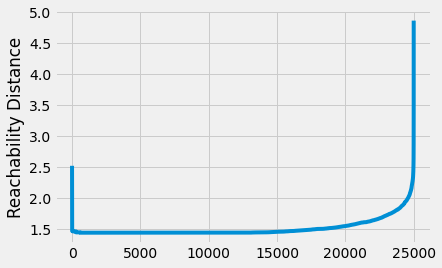

In [ ]:
from sklearn.neighbors import NearestNeighbors

# Compute the k-distance graph
knn = NearestNeighbors(n_neighbors=10)
knn.fit(df_std10)
distances, indices = knn.kneighbors(df_std10)
k_distance = distances[:, -1]

# Plot the reachability distances
optics_model = OPTICS(min_samples=0.5)
optics_model.fit(df_std10)
reachability = optics_model.reachability_[optics_model.ordering_]
plt.plot(reachability)
plt.ylabel('Reachability Distance')
plt.show()


In [ ]:
#for more than 2 dimensions: minPts=2*dim (Sander et al., 1998)
from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec

clust = OPTICS(min_samples=2*len(df_std10.columns), xi=.05, min_cluster_size=.05)

# Run the fit
labelsDB=clust.fit(df_std10).labels_
df_std10['cluster']= labelsDB
df_std10['cluster'].value_counts()

-1    17128
 0     7870
Name: cluster, dtype: int64

In [ ]:
optics_model1 = OPTICS(min_samples=2, xi=0.05, eps=None)
optics_model1.fit(df_std10)
labels_xi = optics_model1.labels_
labels_xi

array([   0, 4573, 7430, ..., 3386, 1873, 5619])

In [ ]:
optics_model2 = OPTICS(min_samples=0.9, xi=0.05, eps=0.5)
optics_model2.fit(df_std10)
labels_eps = optics_model2.labels_
labels_eps

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df_std10['cl_xi']=labels_xi
df_std10

,Recency,Frequency,MonetaryValue,cl_xi
customer_id,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,0
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,4573
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,7430
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,3821
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,51
...,...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,-0.453096,-0.802630,0.322625,3495
fff262fbc647360700cee69566e26989,-0.453096,-0.624766,-0.184184,3419
fff355794e97eaaf07f53f4fdb4d0cd2,-0.453096,-0.460241,0.498833,3386


In [ ]:
df_std10.cl_xi.value_counts()

-1       3144
 6978      10
 4399      10
 3375       9
 2398       9
         ... 
 1187       2
 2561       2
 4900       2
 5212       2
 5812       2
Name: cl_xi, Length: 7807, dtype: int64

In [ ]:
optics_model = OPTICS(min_samples=10, xi=0.05, eps=None)
optics_model.fit(X_scaled)
labels_xi = optics_model.labels_

In [ ]:
op = OPTICS(min_samples=40, xi=0.02, min_cluster_size=0.1)

In [ ]:
op.fit(df_std10)


OPTICS(min_cluster_size=0.1, min_samples=40, xi=0.02)

In [ ]:
# Fit the OPTICS model
clustering = OPTICS(min_samples=30, xi=.05, min_cluster_size=.05)
clustering.fit(df_std10)

# Extract the clusters
labels_opt = clustering.labels_

# Print the cluster labels
print("Cluster Labels:", labels_opt)

Cluster Labels: [0 0 0 ... 0 0 0]


In [ ]:
labels_opt = op.labels_


In [ ]:
labels_opt

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# Configuration options
epsilon = 0.2
min_samples = 6
cluster_method = 'xi'
metric = 'euclidean'


# Compute OPTICS
opt = OPTICS(max_eps=epsilon, min_samples=min_samples, cluster_method=cluster_method, metric=metric).fit(df_std)
labels_opt = opt.labels_

no_clusters = len(np.unique(labels_opt) )
no_noise = np.sum(np.array(labels_opt) == -1, axis=0)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)

Estimated no. of clusters: 1463
Estimated no. of noise points: 11411


## Spectral Clustering

Spectral Clustering is a growing clustering algorithm which has performed better than many traditional clustering algorithms in many cases. It treats each data point as a graph node and thus transforms the clustering problem into a graph-partitioning problem.

In [ ]:
from sklearn.cluster import SpectralClustering 

In [ ]:
df_std11=df_std.copy()
df_std11

NameError: ignored

In [ ]:
# Building the clustering model 
spectral_model_rbf = SpectralClustering(n_clusters = 5, affinity ='rbf') 
  
# Training the model and Storing the predicted cluster labels 
labels_rbf = spectral_model_rbf.fit_predict(df_std11)


In [ ]:
# Building the clustering model 
spectral_model_nn = SpectralClustering(n_clusters = 5, affinity ='nearest_neighbors') 
  
# Training the model and Storing the predicted cluster labels 
labels_nn = spectral_model_nn.fit_predict(df_std11)

In [ ]:
# List of different values of affinity 
affinity = ['rbf', 'nearest-neighbours'] 
  
# List of Silhouette Scores 
s_scores = [] 
  
# Evaluating the performance 
s_scores.append(silhouette_score(df_std11, labels_rbf)) 
s_scores.append(silhouette_score(df_std11, labels_nn)) 
  
# Plotting a Bar Graph to compare the models 
plt.bar(affinity, s_scores) 
plt.xlabel('Affinity') 
plt.ylabel('Silhouette Score') 
plt.title('Comparison of different Spectral Clustering Models') 
plt.show() 

print(s_scores)

In [ ]:
#Clustering with the spectral clustering and visualizing the data
sc=SpectralClustering(n_clusters=4).fit(x)
SpectralClustering(affinity='rbf', assign_labels='kmeans', coef0=1, degree=3,
                   eigen_solver=None, eigen_tol=0.0, gamma=1.0,
                   kernel_params=None, n_clusters=4, n_components=None,
                   n_init=10, n_jobs=None, n_neighbors=10, random_state=None)
labels = sc.labels_
plt.scatter(x[:,0], x[:,1], c=labels)
plt.show()
print(sc)

In [ ]:
# Spectral Clustering
spectral = SpectralClustering(n_clusters=5, affinity='nearest_neighbors', assign_labels='kmeans')
spectral_labels = spectral.fit_predict(X)
spectral_silhouette_score = silhouette_score(X, spectral_labels)

###Evaluation of Spectral Clustering Model

##BIRCH

BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies) is a scalable clustering method that performs hierarchical clustering and requires a one-time scan of the dataset, making it fast to incrementally and dynamically cluster incoming, multi-dimensional metric data. This algorithm is based on the CF (clustering features) tree. In addition, this algorithm uses a tree-structured summary to create clusters. The tree structure of the given data is built by the BIRCH algorithm and is called the Clustering feature tree (CF tree). In most cases, BIRCH only requires a single scan of the database. It consists of three parameters, a threshold, the branching factor and the number of clusters.


▪ threshold
This is the maximum number of data samples that will be considered in a sub-cluster in the leaf node of the CF tree.

▪ branching_factor
This parameter specifies the maximum number of CF sub-clusters in each node.

▪ n_clusters
The number of clusters after the final clustering step.

In [ ]:
from sklearn.cluster import Birch

In [ ]:
df_std12=df_std.copy()
df_std12

,Recency,Frequency,MonetaryValue
customer_id,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521
...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,-0.453096,-0.802630,0.322625
fff262fbc647360700cee69566e26989,-0.453096,-0.624766,-0.184184
fff355794e97eaaf07f53f4fdb4d0cd2,-0.453096,-0.460241,0.498833


In [ ]:
# Set the range of values for the threshold parameter
thresholds = np.linspace(0.1, 2, 20)

# Set the range of values for the branching factor parameter
branching_factors = [5, 10, 15, 20, 25, 30]

# Create an empty list to store the silhouette scores
scores = []

# Loop through all combinations of threshold and branching factor values
for t in thresholds:
    for b in branching_factors:
        
        # Create the Birch clustering model
        birch_model = Birch(threshold=t, branching_factor=b)
        
        # Fit the model to the data
        birch_model.fit(df_std12)
        
        # Calculate the silhouette score
        score = silhouette_score(df_std12, birch_model.predict(df_std12))
        
        # Add the score to the list of scores
        scores.append((t, b, score))

# Sort the scores by descending silhouette score
scores.sort(key=lambda x: x[2], reverse=True)

# Print the parameters with the highest silhouette score
print("Best parameters: threshold={}, branching_factor={}, silhouette_score={}".format(scores[0][0], scores[0][1], scores[0][2]))


Best parameters: threshold=0.8999999999999999, branching_factor=15, silhouette_score=0.402207011143301


In [ ]:
# Fit the model with the best parameters
birch_model = Birch(threshold=scores[0][0], branching_factor=scores[0][1],n_clusters=5)
birch_model.fit(df_std12)

# Predict the clusters for the data
clusters = birch_model.predict(df_std12)

# Add the cluster labels to the original dataframe
df_std12['Cluster'] = clusters
df_std12

,Recency,Frequency,MonetaryValue,Cluster
customer_id,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,4
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,4
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,0
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,1
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,4
...,...,...,...,...
ffea41c4dcc53a7ffd316f22ddb97be7,-0.453096,-0.802630,0.322625,1
fff262fbc647360700cee69566e26989,-0.453096,-0.624766,-0.184184,1
fff355794e97eaaf07f53f4fdb4d0cd2,-0.453096,-0.460241,0.498833,1


In [ ]:
df_std12.Cluster.value_counts()

1    12128
0     9517
4     3301
3       51
2        1
Name: Cluster, dtype: int64

This is the final model for the Birch clustering

In [ ]:
model_br = Birch(threshold=0.02, n_clusters=5,branching_factor=22)
model_br.fit(df_std)
#
yhat_br = model_br.predict(df_std)
clusters_br = np.unique(yhat_br)
print("Clusters of Birch",clusters_br)
labels_br = model_br.labels_
score_br = silhouette_score(df_std,labels_br)
print("Score of Birch = ", score_br)

Clusters of Birch [0 1 2 3 4]
Score of Birch =  0.2246933030312251


In [ ]:
df_std12['Cluster']=labels_br

([<matplotlib.axis.XTick at 0x7fd0d99b0a60>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

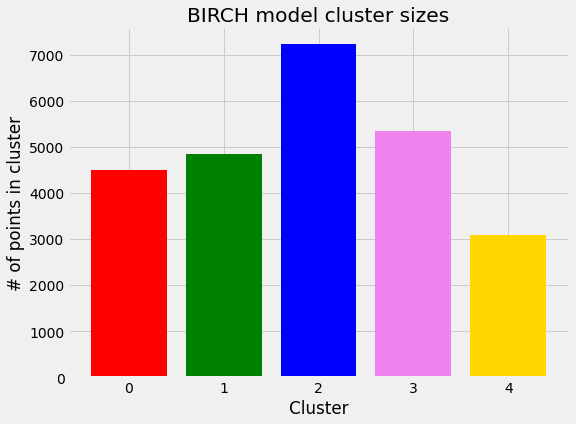

In [ ]:
n_0 = len(np.where(labels_br==0)[0])
n_1 = len(np.where(labels_br==1)[0])
n_2 = len(np.where(labels_br==2)[0])
n_3 = len(np.where(labels_br==3)[0])
n_4 = len(np.where(labels_br==4)[0])
plt.figure(figsize=(8, 6))
plt.style.use('fivethirtyeight')
plt.bar(range(5), [n_0, n_1, n_2, n_3,n_4], align='center',color=['red', 'green', 'blue', 'violet','gold'])
plt.title('BIRCH model cluster sizes')
plt.xlabel('Cluster')
plt.ylabel('# of points in cluster')
plt.xticks(range(5),['0', '1', '2', '3','4'])

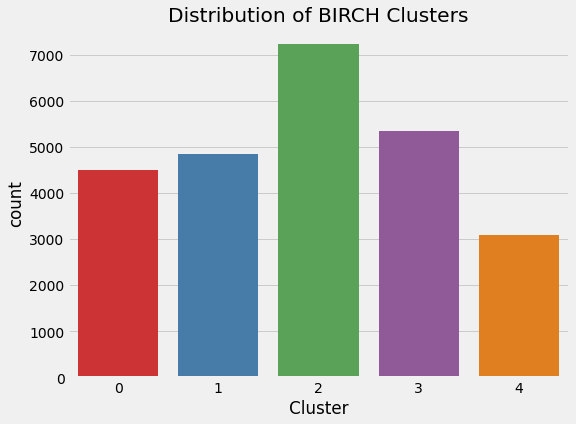

In [ ]:
#Plotting countplot of clusters
plt.figure(figsize=(8, 6))
pl = sns.countplot(x=df_std12["Cluster"], palette= 'Set1',)
pl.set_title("Distribution of BIRCH Clusters")
plt.show()

In [ ]:
# calculate the Silhouette Coefficient
sil_score = silhouette_score(df_std, labels_br)
print(f"Silhouette Coefficient for BIRCH model with (k=5): {sil_score:.4f}")

# calculate the Calinski-Harabasz Index
ch_score = calinski_harabasz_score(df_std, labels_br)
print(f"Calinski-Harabasz Index for BIRCH model with (k=5): {ch_score:.4f}")

# calculate the Davies-Bouldin Index
db_score = davies_bouldin_score(df_std, labels_br)
print(f"Davies-Bouldin Index for BIRCH model with (k=5): {db_score:.4f}\n")

Silhouette Coefficient for BIRCH model with (k=5): 0.2247
Calinski-Harabasz Index for BIRCH model with (k=5): 11646.8182
Davies-Bouldin Index for BIRCH model with (k=5): 1.2566



In [ ]:
# We create a new data frame with the original features and add a new column with the assigned clusters for each point.
df_std13= df_std12.copy()
df_std13['ID'] = df_std12.index
# df_normalized['Cluster'] = model.labels_
df_std13.head()

,Recency,Frequency,MonetaryValue,Cluster,ID
customer_id,,,,,
0001496e540173a40362759ed10b3ce2,-1.012180,1.378432,1.394979,4,0001496e540173a40362759ed10b3ce2
0003b7de618c1acfc67eac91b853b287,-0.057881,1.307286,1.044241,3,0003b7de618c1acfc67eac91b853b287
00045e9d1c96d7e2353f886704e51c88,1.565666,-0.624766,-2.411124,0,00045e9d1c96d7e2353f886704e51c88
000e223791e890e85938d71bee32cf5a,-0.453096,2.185492,-0.685959,3,000e223791e890e85938d71bee32cf5a
0016652ea3c3a1176dd2385e89de9ff6,-1.012180,1.576306,1.522521,4,0016652ea3c3a1176dd2385e89de9ff6


In [ ]:
# Melt The Data
df_nor_melt13 = pd.melt(df_std13.reset_index(),
                      id_vars=['ID', 'Cluster'],
                      value_vars=['Recency','Frequency','MonetaryValue'],
                      var_name='Attribute',
                      value_name='Value')
df_nor_melt13.head()

,ID,Cluster,Attribute,Value
0,0001496e540173a40362759ed10b3ce2,4,Recency,-1.012180
1,0003b7de618c1acfc67eac91b853b287,3,Recency,-0.057881
2,00045e9d1c96d7e2353f886704e51c88,0,Recency,1.565666
3,000e223791e890e85938d71bee32cf5a,3,Recency,-0.453096
4,0016652ea3c3a1176dd2385e89de9ff6,4,Recency,-1.012180


<AxesSubplot:xlabel='Attribute', ylabel='Value'>

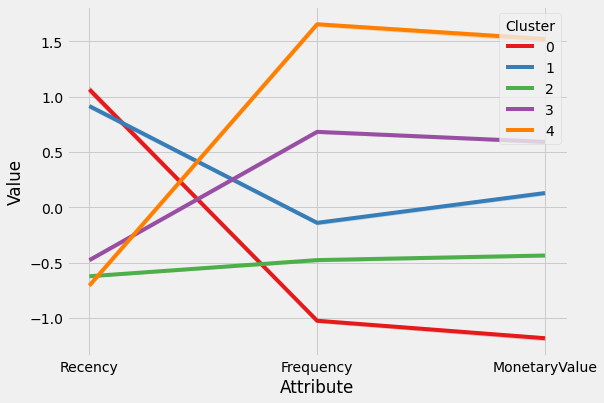

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot('Attribute', 'Value', hue='Cluster', data=df_nor_melt13,palette='Set1')

In [ ]:
def tracer(db, n, name):
    '''
    This function returns trace object for Plotly
    '''
    return go.Scatter3d(
        x = db[db['Cluster']==n]['Frequency'],
        y = db[db['Cluster']==n]['Recency'],
        z = db[db['Cluster']==n]['MonetaryValue'],
        mode = 'markers',
        name = name,
        marker = dict(
        size = 3,  # set color to an array/list of desired values
        colorscale='Viridis', 
        )
     )

trace0 = tracer(df_std13, 0, 'Cluster 0')
trace1 = tracer(df_std13, 1, 'Cluster 1')
trace2 = tracer(df_std13, 2, 'Cluster 2')
trace3 = tracer(df_std13, 3, 'Cluster 3')
trace4 = tracer(df_std13, 4, 'Cluster 4')

data = [trace0,trace1,trace2,trace3,trace4]

layout = go.Layout(
    title = 'Clusters of BIRCH',
    scene = dict(
            xaxis = dict(title = 'Frequency'),
            yaxis = dict(title = 'Recency'),
            zaxis = dict(title = 'MonetaryValue')
        )
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

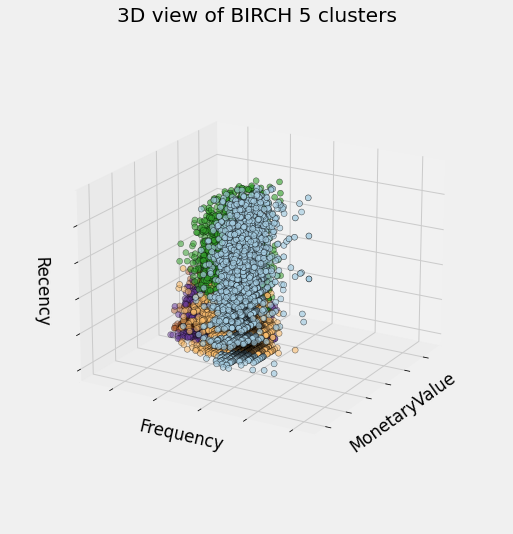

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(7, 7))
ax = Axes3D(fig, rect=[0, 0, .99, 1], elev=20, azim=210)
ax.scatter(df_std13['MonetaryValue'],
           df_std13['Frequency'],
           df_std13['Recency'],
           c=df_std13['Cluster'],
           s=35, edgecolor='k', cmap=plt.cm.Paired)

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_xlabel('MonetaryValue')
ax.set_ylabel('Frequency')
ax.set_zlabel('Recency')
ax.set_title('3D view of BIRCH 5 clusters')
ax.dist = 12

plt.show()


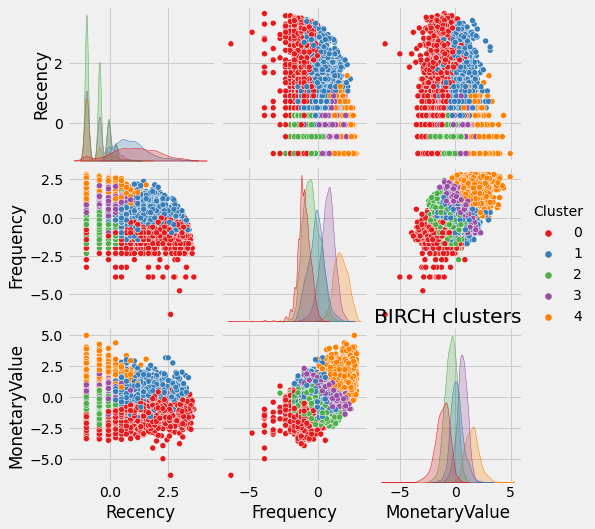

In [ ]:
sns.pairplot(df_std13, hue="Cluster",palette='Set1')
plt.title('BIRCH clusters')
plt.show()

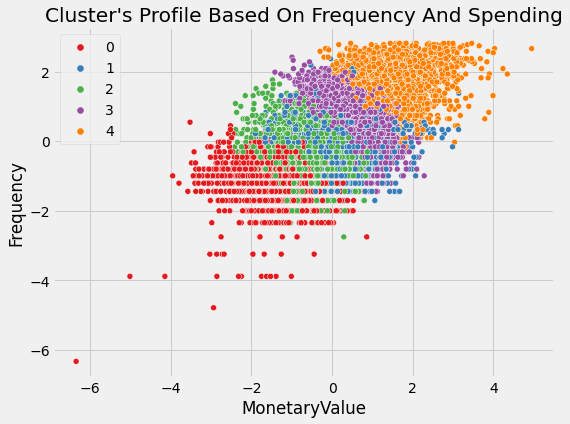

In [ ]:
plt.figure(figsize=(8, 6))
pl = sns.scatterplot(data = df_std13,x=df_std13["MonetaryValue"], y=df_std13["Frequency"],hue=df_std13["Cluster"], palette= 'Set1')
pl.set_title("Cluster's Profile Based On Frequency And Spending")
plt.legend()
plt.show()

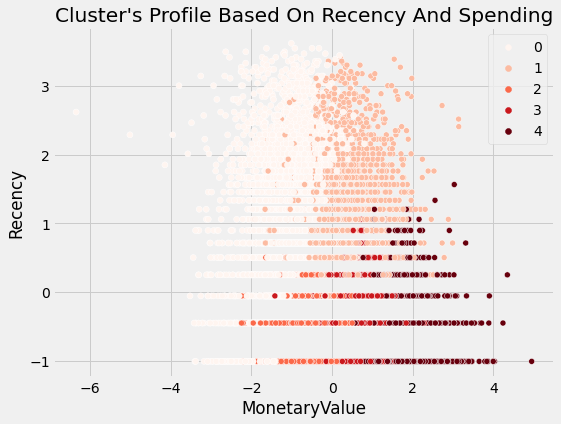

In [ ]:
plt.figure(figsize=(8, 6))
pl = sns.scatterplot(data = df_std13,x=df_std13["MonetaryValue"], y=df_std13["Recency"],hue=df_std13["Cluster"], palette= 'Reds')
pl.set_title("Cluster's Profile Based On Recency And Spending")
plt.legend()
plt.show()

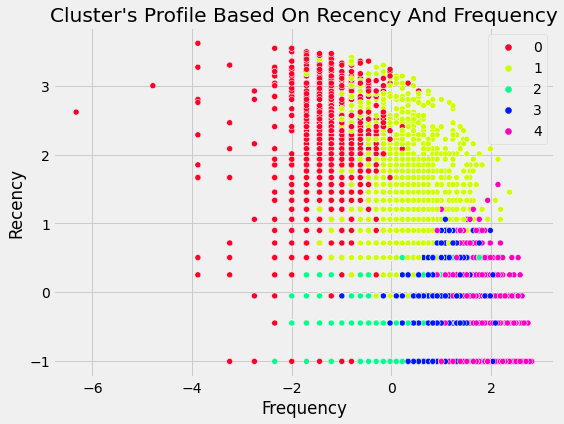

In [ ]:
plt.figure(figsize=(8, 6))
pl = sns.scatterplot(data = df_std13,x=df_std13["Frequency"], y=df_std13["Recency"],hue=df_std13["Cluster"], palette= 'gist_rainbow')
pl.set_title("Cluster's Profile Based On Recency And Frequency")
plt.legend()
plt.show()

In [ ]:
#scatter plot to display segments
import plotly.express as px
#rfm_scatter = df_std2[(df_std2['MonetaryValue']) & (df_std2['Recency']) & (df_std2['Frequency'])]
fig = px.scatter(rfm_data, x="Recency", y="Frequency", color=df_std13["Cluster"],
                 size=rfm_data['MonetaryValue'])
fig.show()

#Conclusion

1.  We started with a simple quantile based segmentation model first then moved to more complex models because simple implementation helps having a first glance at the data and know where/how to exploit it better.

2.  Then we moved to k-means clustering, Agglomerative, DBSCAN,GMM and BIRCH and visualized the results with different number of clusters.

3. We created several useful clusters of customers on the basis of different methods in order to segment customers obased on their purchasing behavior define their value and loyalty the business. 

4. The results of the segments based on the metrics were utilized were acceptable for some models and of lower value for others. Overall the clusters appear well separated. However, in order to maximize the available information from each customer and explore other techniques as well, we will move on and create clusters based on a mixed data type dataset which can be found in the fourth Notebook of the analysis


# Thank you for making it so far!
### The next part, after having implemented the RFM Clustering Methodology is to preprocess the data for the Mixed Data Models, which is done in Notebook Part 3 and is available in my [GitHub](https://github.com/jenny-cobanaj/Field-Study-Project-Customer_Segmentation) portfolio.